# Unpacking Lead-Lag Dynamics Between Oil Prices and Stock Markets 

## Research Motivation 

Oil and gasoline prices are often treated as key economic indicators. But do they lead equity markets—or do stock prices anticipate them? This project investigates the direction and timing of causality between energy prices and U.S. stock prices. Prior academic research has focused on investigating the impact of oil market movements on the stock market, finding various levels and types of correlation depending whether it is an index, a company in a specific industry or country etc. The transmission mechanism consists of direct impacts on businesses that use or sell oil, as well as through increased volatility. 

In this section, we will look at how the cost difference between refined, retail oil and crude oil impacts the stock market and whether this effect is transmitted through consumer behvaviour, seen with higher correlations with market-wide indices or through oil industry cashflows, seen with a higher correlation for companies in specific industries.

## Data Preprocessing and Exploratory Data Analysis (EDA)
We utilize the following datasets to examine trends in stocks/etfs, commodities and gasoline pricing. For each dataset, we identify specific variables of interest:

|**Dataset**|**Selected Variable**|**Descriptions**|
|-----------|---------------------|--------------------------------------|
| Weekly Petrol Prices | Price | Price reported for that week|
| Daily Stocks and Etfs | Close | Last price at which a stock trades|
| Daily Commodities Statistics | Value | Its free market value |


## Visualising Overall Trends

After cleaning the data, we can conduct simple visualisation with a graph and correlation matrix. For gasoline, we break it up into regional analysis and type analysis for the 'US'.

### Findings 
- Gasoline prices tend to move together, with some differences due to grades.
- The dispersion in prices due to regional variations has increased in recent years. Amongst the regions, US is the most highly correlated, followed by Texas, a oil producing state. Seattle and Washington had lower correlations with gasoline prices with other states, but the correlation was still extremely high. 
- Stock prices also tend to move together, with SPY, VOO and XOM being significantly higher as they include Technology stocks that boomed in the 21st century. Data for certain stocks, such as ONEQ is also not available for the full time period. 

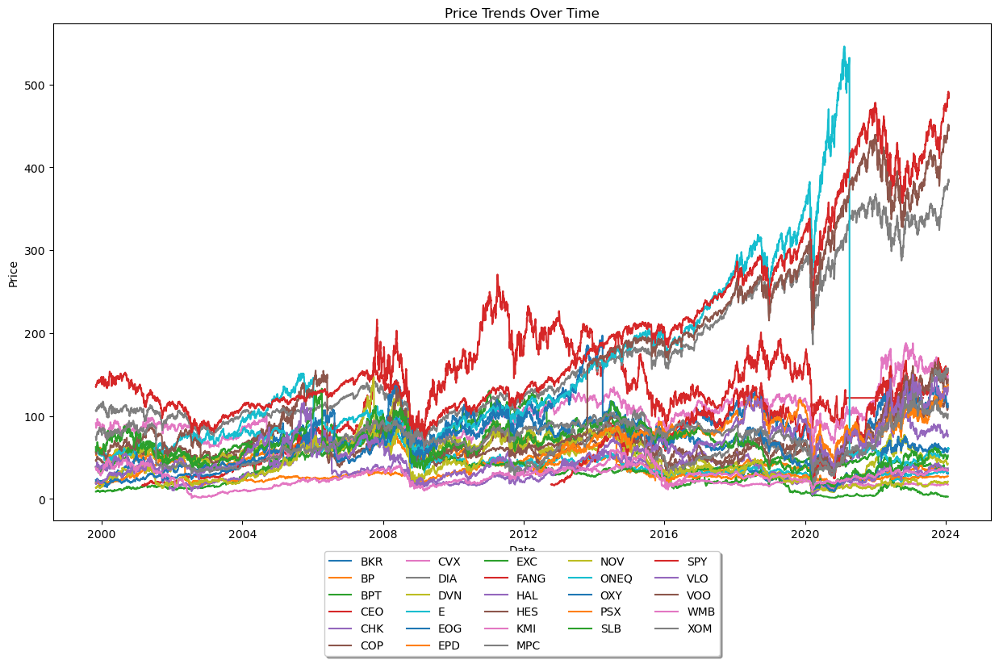

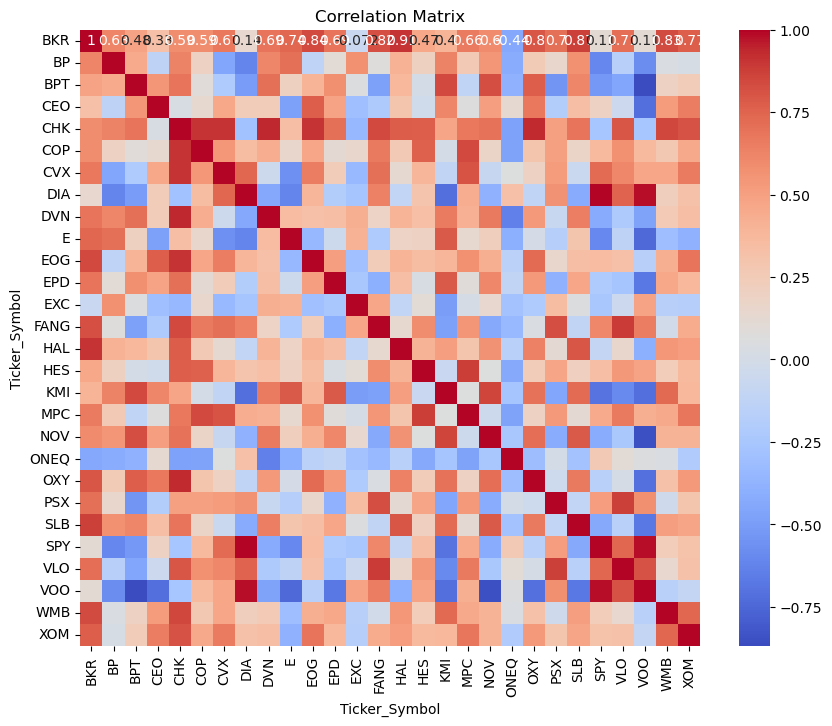

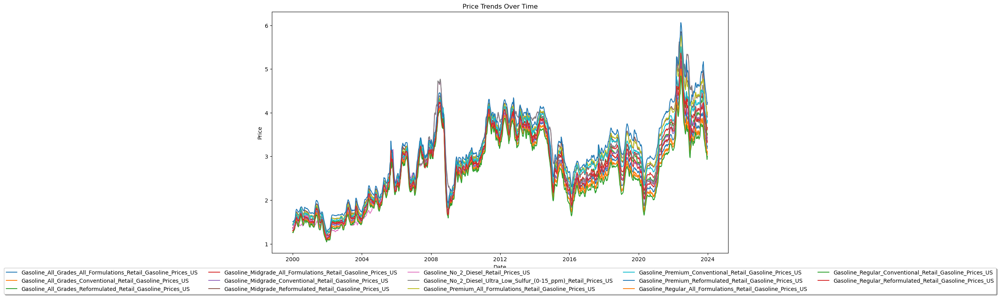

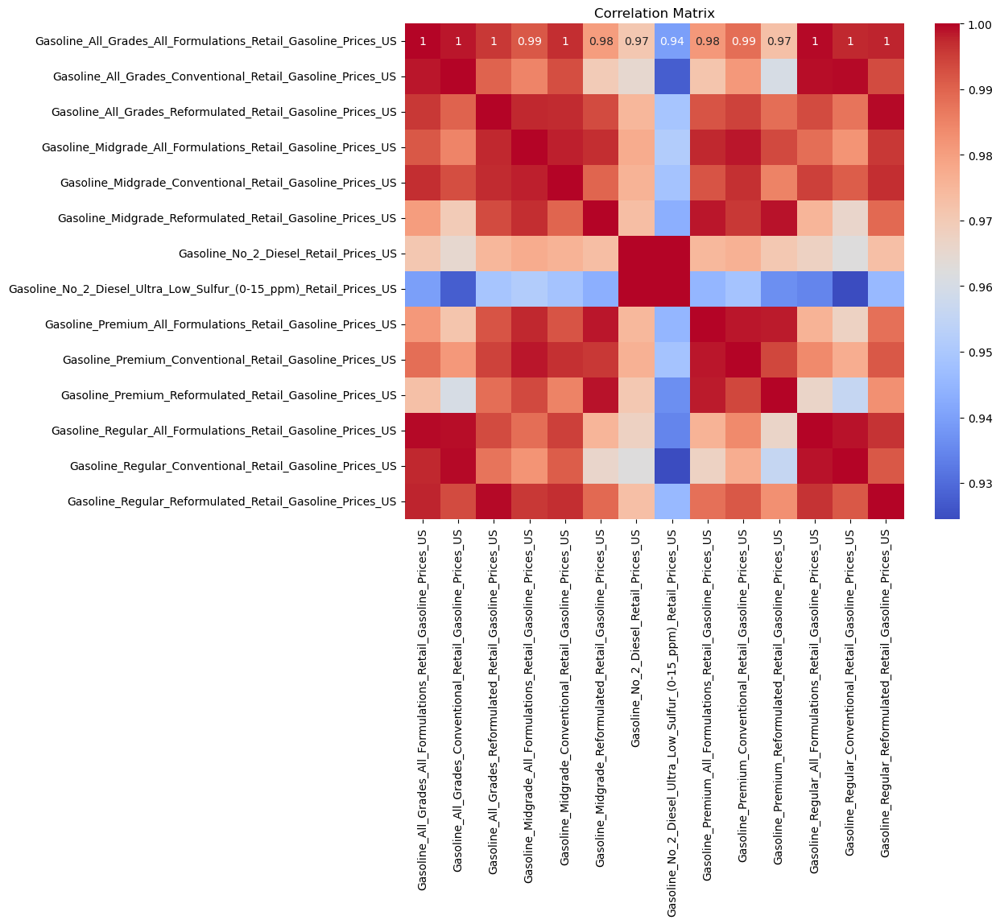

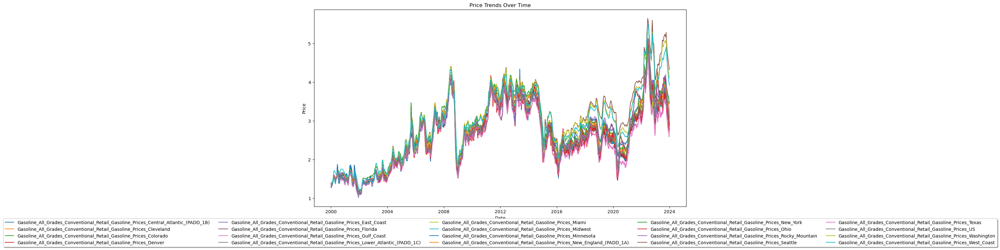

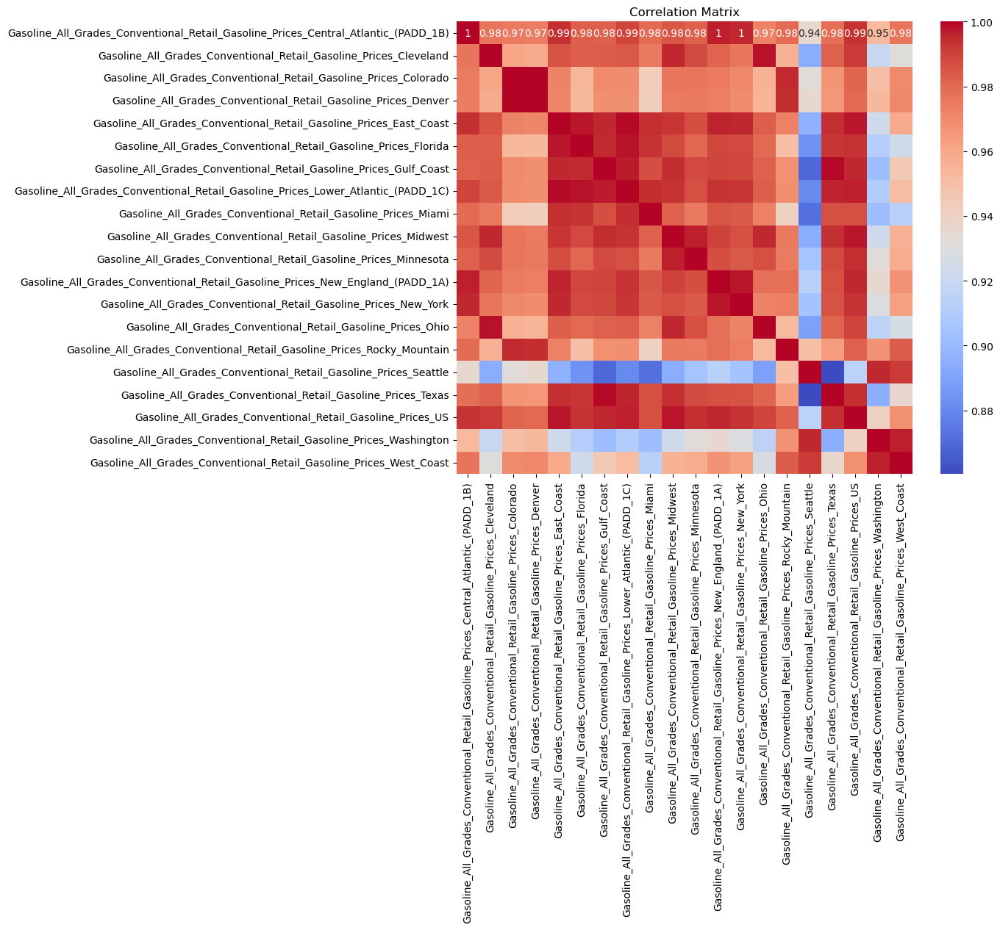

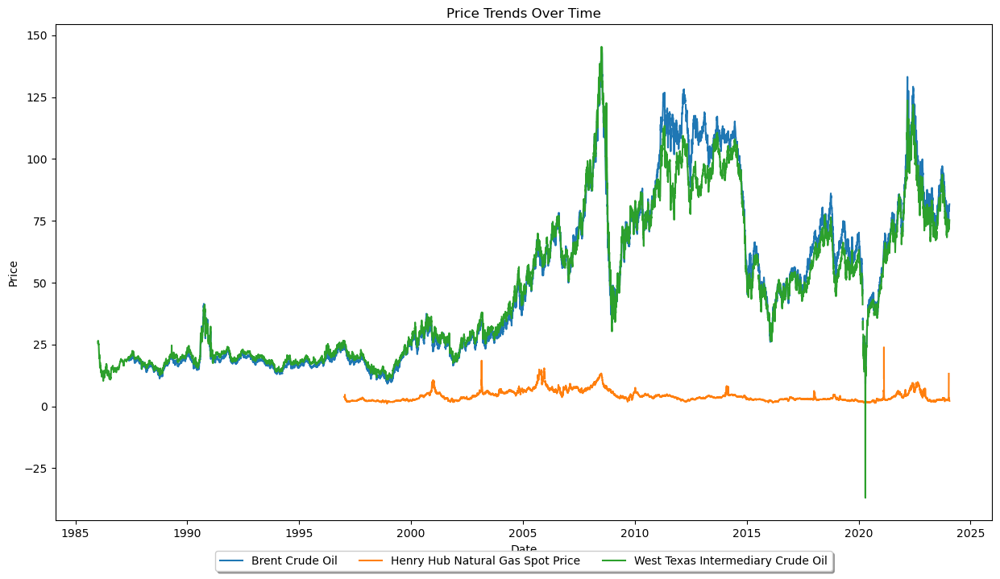

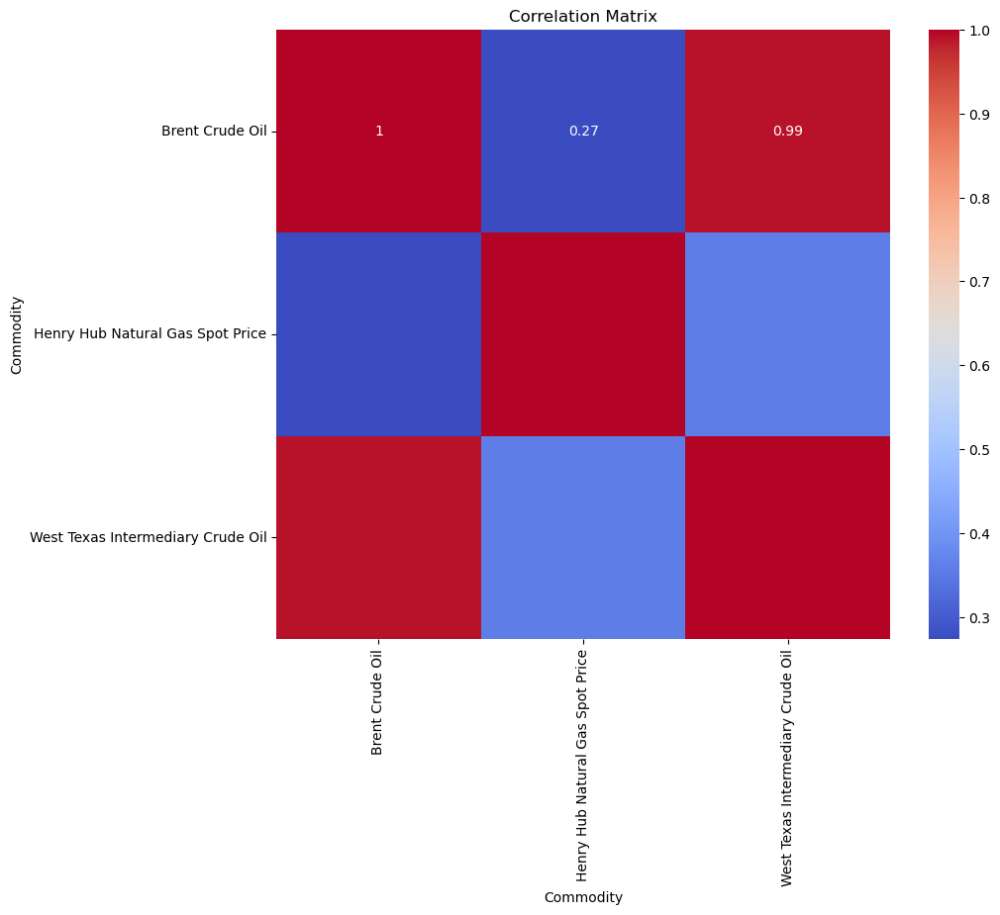

In [12]:
perform_eda(combined_df) 
location = "US"
type_cols = [col for col in gasoline_df.columns if col.endswith(f'_{location}')]
gasoline_df_us = gasoline_df[type_cols]
perform_eda(gasoline_df_us)
type_gas = "Gasoline_All_Grades_Conventional"
selected_cols = [col for col in gasoline_df.columns if col.startswith(type_gas)]
gasoline_df_retail_all = gasoline_df[selected_cols]
perform_eda(gasoline_df_retail_all)
perform_eda(commodity_df)

## Rolling Correlation 

Next we look at the rolling correlation between stocks and gasoline prices. 
Selected stocks include, SPY (market wide index), CEO (Oil and Gas Equipment), EOG (Crude Petroleum and Natural Gas), SLB (Oil and Gas Field Services). 
Selected Gasoline includes the price difference between retail and crude oil, conventional US retail Gasoline prices and Crude Oil.

The Graphs only depict correlations statistically significant to 5%.

### Observations 
- changes in the price difference between retail and crude oil is only correlated positively with changes in stock prices, where as changes in prices of conventional US retail Gasoline and crude oil correlate largely positively, but are sometimes negative.
- There is some seasonal variation observed, but this could also be volatility.

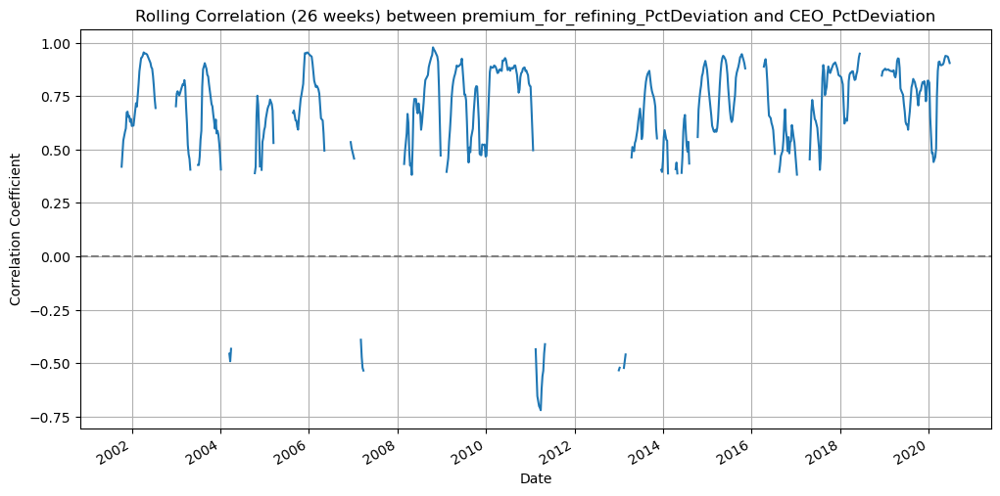

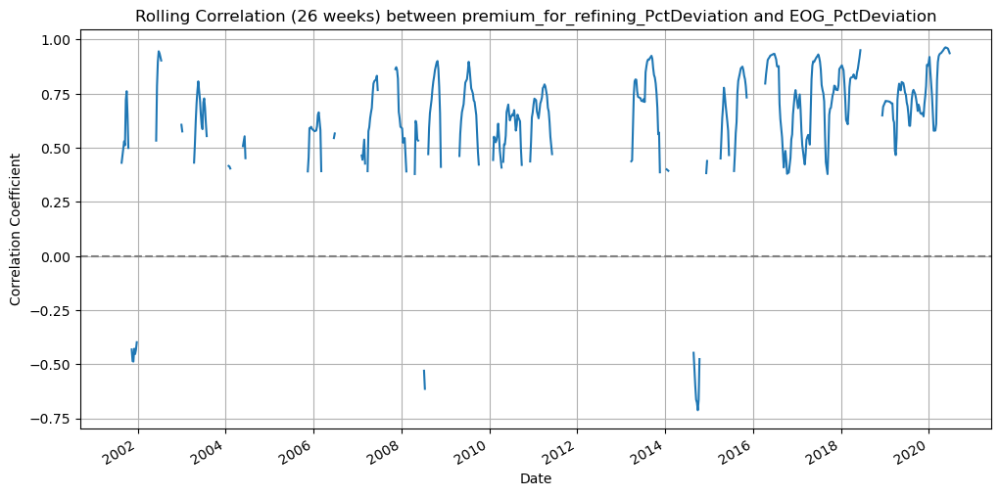

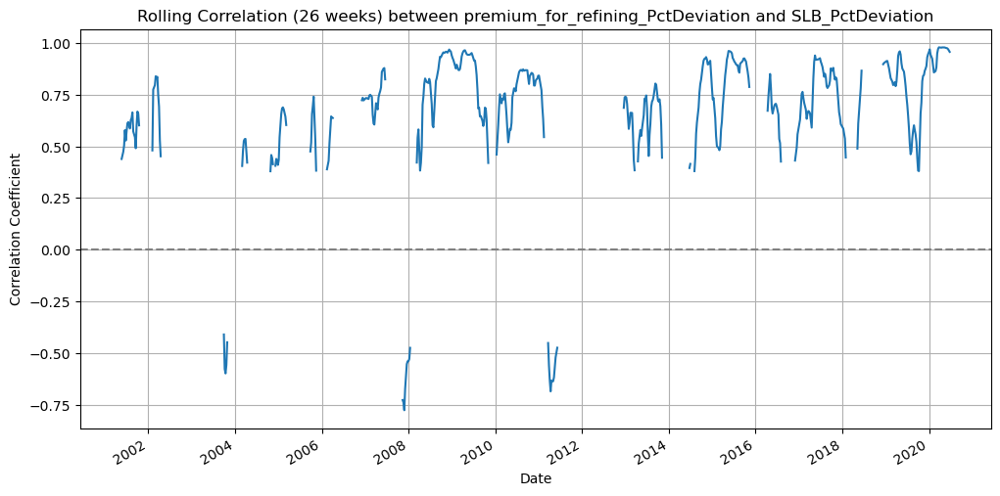

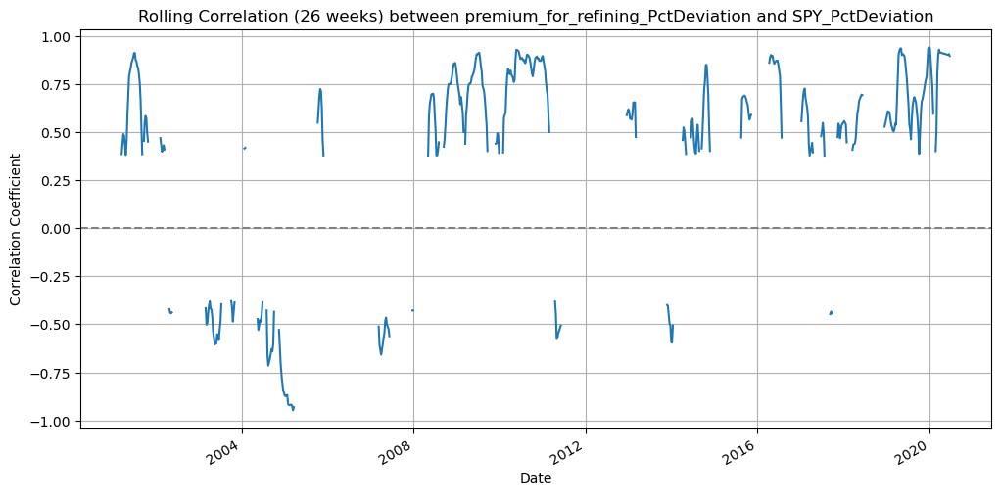

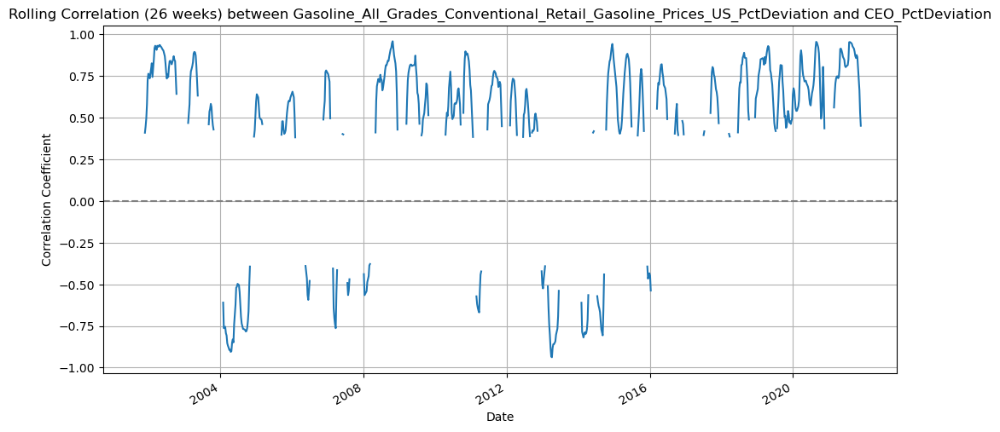

...

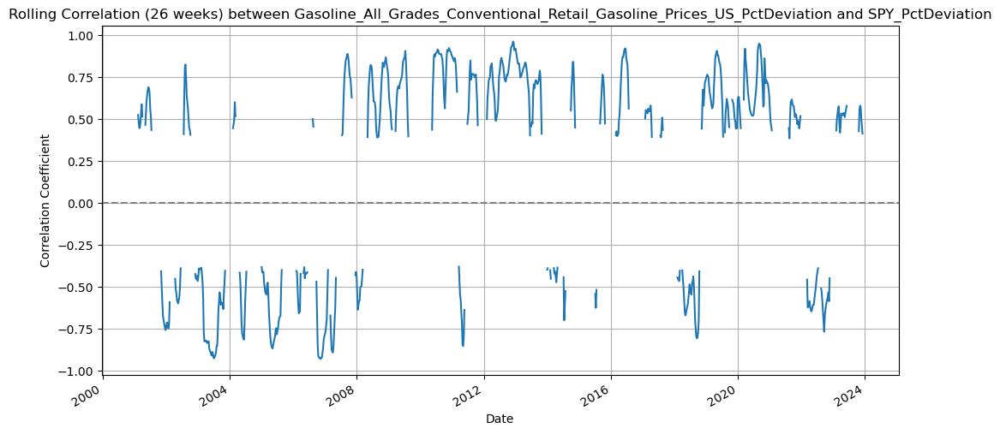

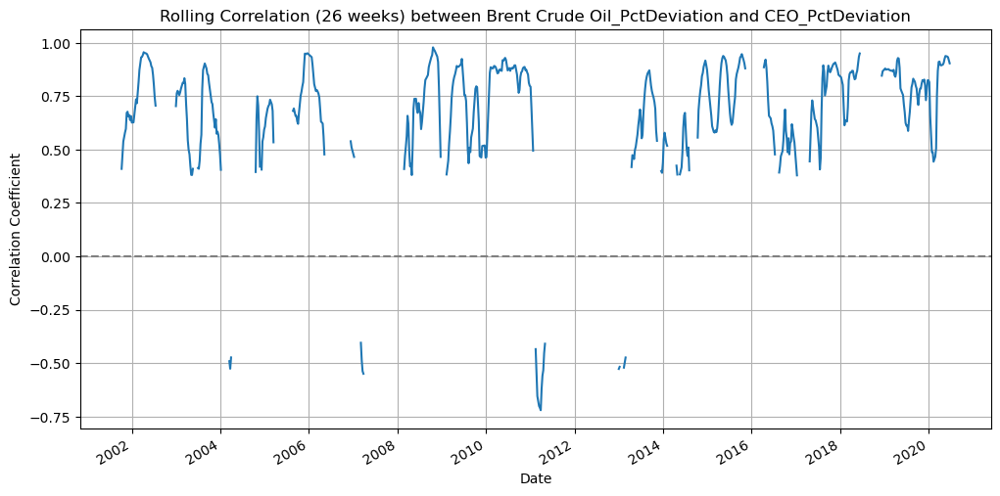

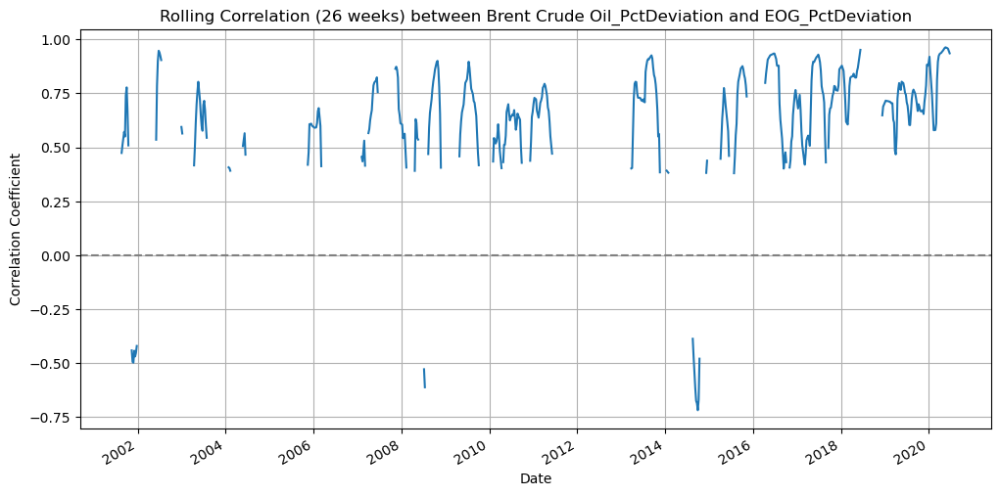

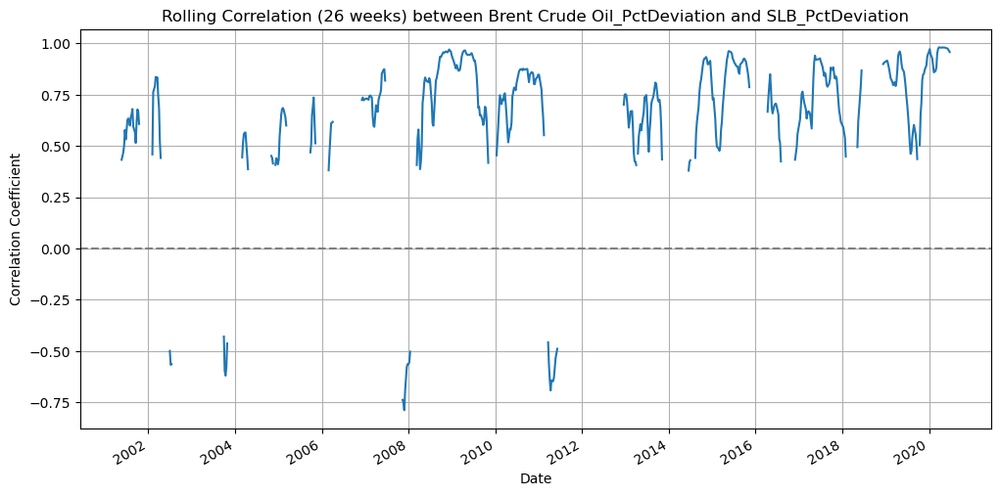

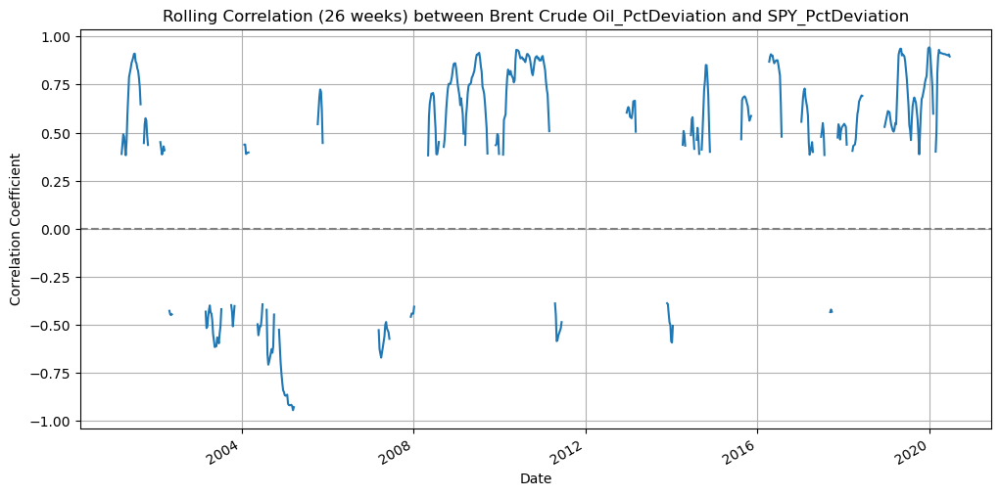

In [21]:
merged_df_draft = pd.merge(gasoline_df, combined_df, left_index=True, right_index=True, how='inner')
merged_df = pd.merge(merged_df_draft, commodity_df, left_index=True, right_index=True, how='inner')


# create a new variable that is the difference between crude and refined oil
merged_df['premium_for_refining']= merged_df['Gasoline_All_Grades_Conventional_Retail_Gasoline_Prices_US']-merged_df['Brent Crude Oil']

# Calculate p-values for significance
def calculate_p_value(r, n):
    t = r * np.sqrt((n - 2) / (1 - r**2))
    return 2 * (1 - stats.t.cdf(np.abs(t), df=n-2))

def calculate_rolling_correlation(merged_df, var1, var2, window=26, min_periods=12):
    """
    Calculate rolling correlation between two variables with significance testing

    Parameters:
    merged_df (DataFrame): Merged dataset with all variables
    var1 (str): First variable name
    var2 (str): Second variable name
    window (int): Rolling window size in weeks
    min_periods (int): Minimum observations needed for calculation

    Returns:
    Series: Rolling correlations (NaN where not significant)
    """
    # Extract the two variables
    x = merged_df[var1]
    y = merged_df[var2]

    # Calculate rolling correlation
    rolling_corr = x.rolling(window=window, min_periods=min_periods).corr(y)

    # Only keep correlations that are significant at p < 0.05
    n_obs = x.rolling(window=window, min_periods=min_periods).count()
    p_values = calculate_p_value(rolling_corr, n_obs)
    significant_corr = rolling_corr.where(p_values < 0.10)

    """Plot the rolling correlation"""
    plt.figure(figsize=(12, 6))
    significant_corr.plot(title=f'Rolling Correlation (26 weeks) between {var1} and {var2}')
    plt.axhline(0, color='gray', linestyle='--')
    plt.ylabel('Correlation Coefficient')
    plt.xlabel('Date')
    plt.grid(True)
    plt.show()

    return significant_corr

x_vars = ['premium_for_refining', 'Gasoline_All_Grades_Conventional_Retail_Gasoline_Prices_US', 'Brent Crude Oil']
y_vars = [  'CEO', 'EOG', 'SLB', 'SPY']

all_vars = list(set(x_vars + y_vars))

window = 20
min_periods = 10

for col in all_vars:
    if col in merged_df.columns:
        # Calculate rolling average
        rolling_avg = merged_df[col].rolling(window=window).mean()
        # Calculate percentage deviation
        merged_df[f'{col}_PctDeviation'] = (merged_df[col] - rolling_avg) / rolling_avg * 100

df_correlation = []
x_vars_pct = [f"{var}_PctDeviation" for var in x_vars]
y_vars_pct = [f"{var}_PctDeviation" for var in y_vars]


for x_i in x_vars_pct:
    for y_i in y_vars_pct:
        # Create column name for the correlation
        corr_col = f'RollingCorr_{x_i}_vs_{y_i}'

        # Calculate rolling correlation
        calculate_rolling_correlation(
            merged_df,
            x_i,
            y_i,
            window=window,
            min_periods=min_periods
        )

## Lag analysis

Next, we look into how the correlation differs with lags and conduct Granger Causality tests. 

### Observations
 - The price difference between retail and crude oil, and crude oil prices have a significant correlations with lags of 1 or larger.
 - The price of Conventional Retail Gasoline is correlated significantly with lag of 1.

/var/folders/cr/36btg3p15138sc76kdvyfcpm0000gr/T/ipykernel_64006/1271203870.py:6: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns_df = analysis_df.pct_change().dropna()


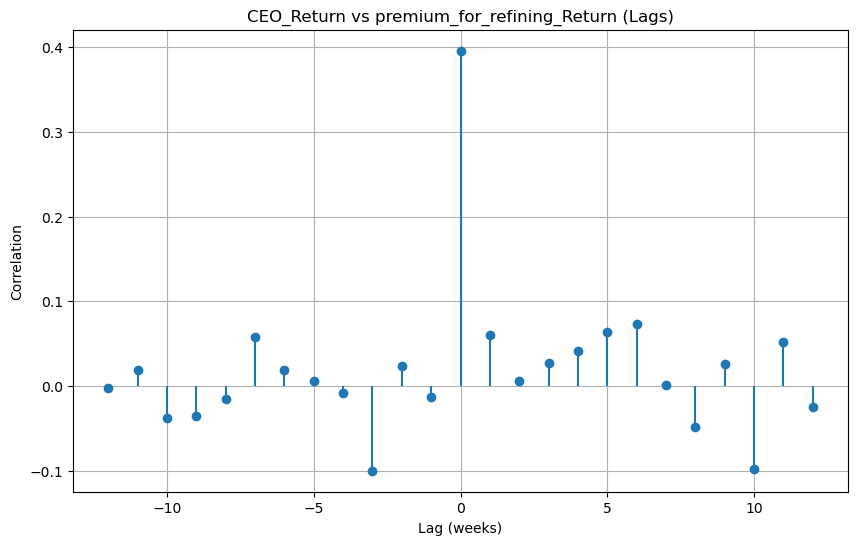

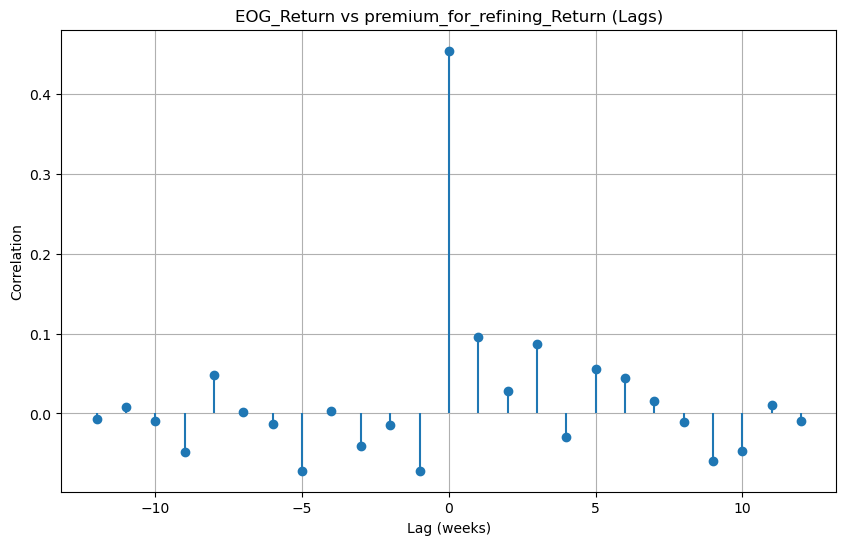

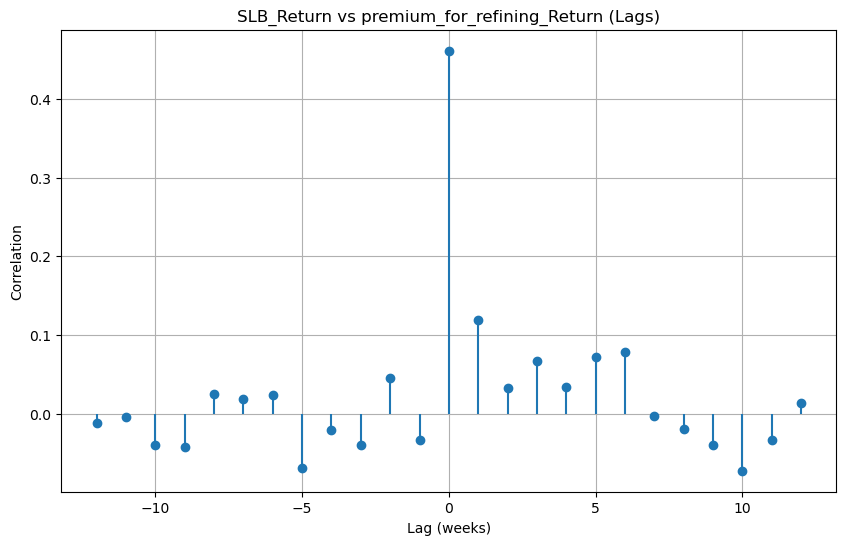

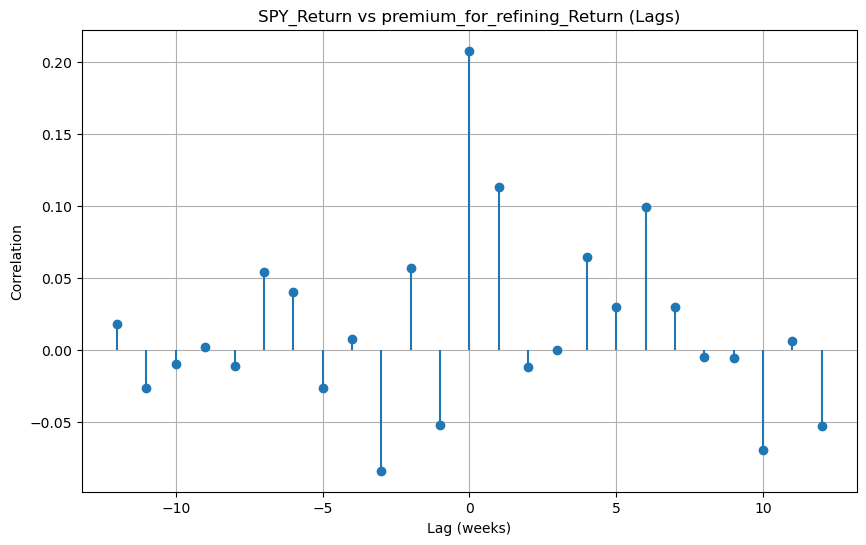

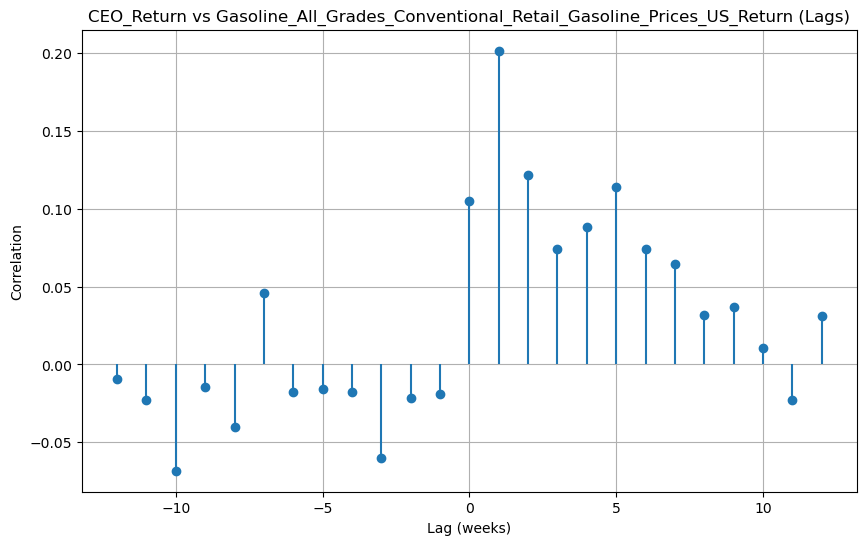

...

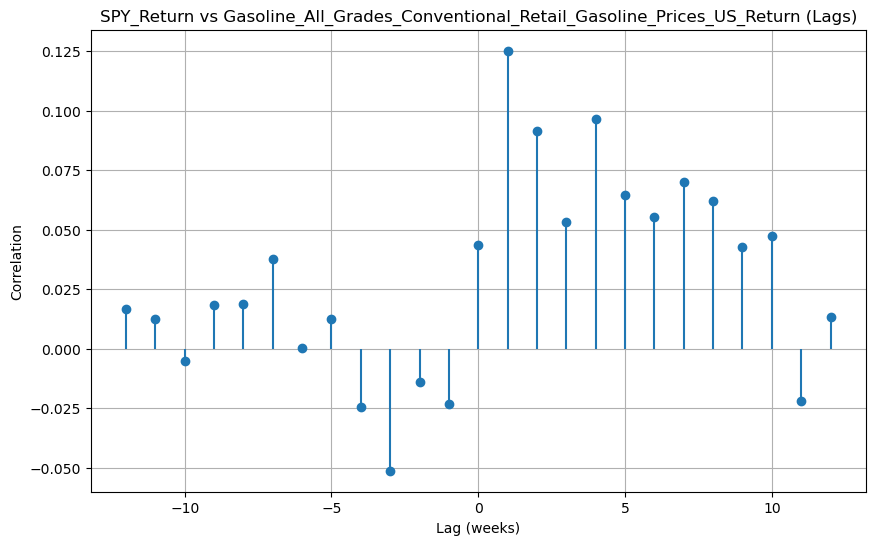

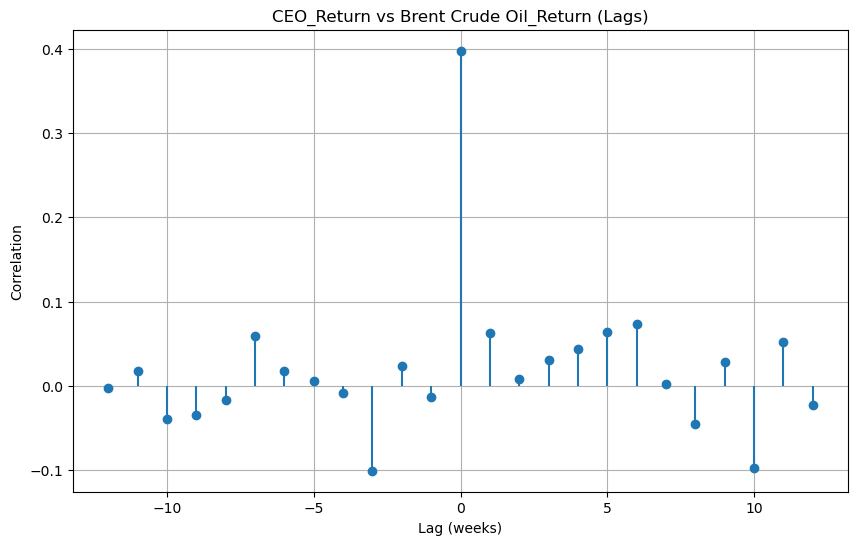

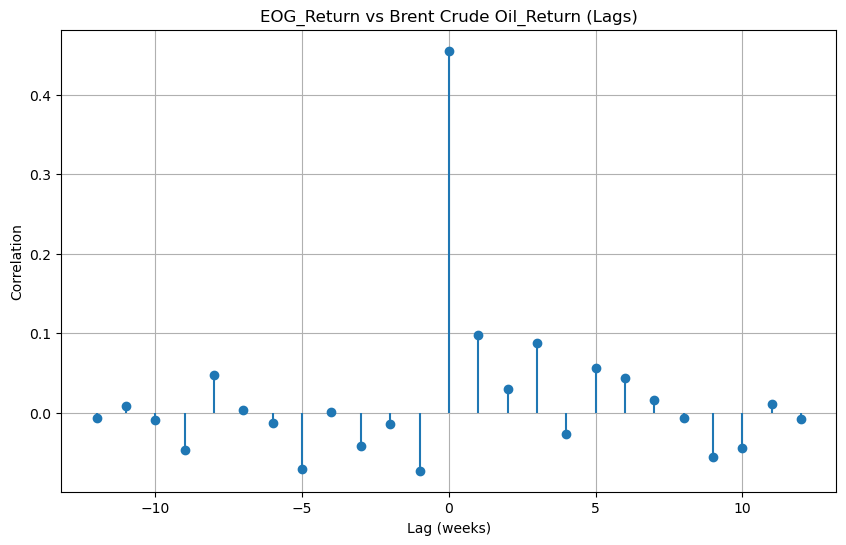

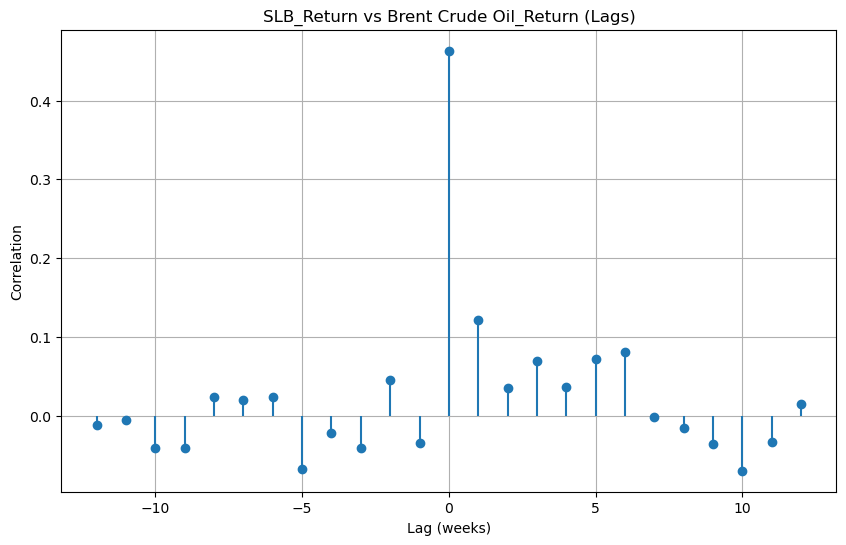

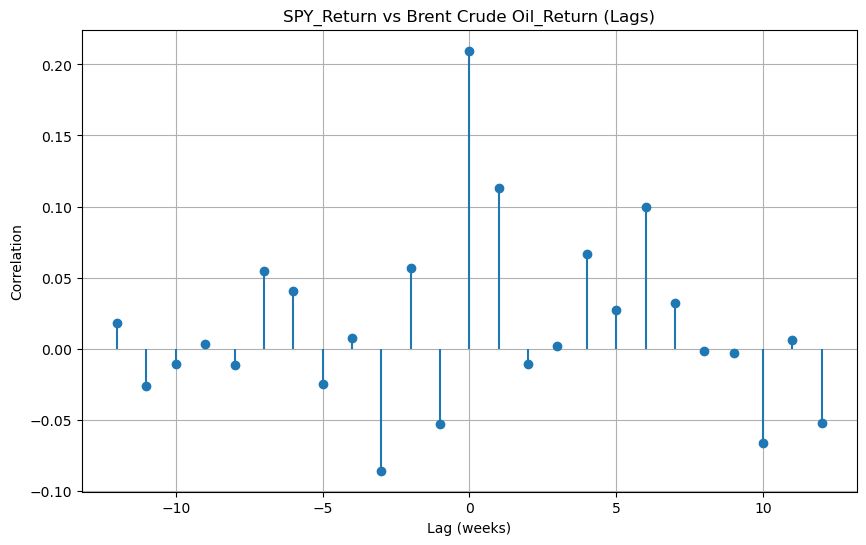

In [28]:
selected_gasoline = x_vars
selected_stocks = y_vars

analysis_df = merged_df[all_vars]

returns_df = analysis_df.pct_change().dropna()
returns_df.columns = [f'{col}_Return' for col in returns_df.columns]

def cross_correlation_analysis(series_x, series_y, max_lag=12, min_obs=5):
    """
    Calculate cross-correlations with NaN handling
    """
    results = []

    for lag in range(-max_lag, max_lag+1):
        if lag < 0:
            corr = series_x.shift(-lag).corr(series_y)
        else:
            corr = series_x.corr(series_y.shift(lag))

        results.append({
            'Lag': lag,
            'Correlation': corr,
            'Absolute_Correlation': abs(corr)
        })

    # Return UNSORTED results in lag order
    return pd.DataFrame(results)

def plot_cross_correlations(gas_series, stock_series, max_lag=12):
    """Plot cross-correlations with proper NaN handling"""
    plt.figure(figsize=(12, 6))

    # Calculate correlations
    ccf = cross_correlation_analysis(gas_series, stock_series, max_lag)

    # Fill NaN correlations with 0 for plotting
    plot_data = ccf.fillna({'Correlation': 0})

    # Create stem plot
    markerline, stemlines, baseline = plt.stem(plot_data['Lag'], plot_data['Correlation'],
                                            linefmt='C0-', markerfmt='C0o',
                                            basefmt=" ")

    # Formatting
    plt.title(f'{stock_series.name} vs {gas_series.name} (Lags)')
    plt.xlabel('Lag (weeks)')
    plt.ylabel('Correlation')
    plt.xticks(range(-max_lag, max_lag+1))
    plt.grid(True)
    plt.ylim(-1.1, 1.1)  # Fixed correlation range

    # Add warning for NaN values
    if ccf['Correlation'].isna().any():
        plt.text(0.05, 0.95,
                "Warning: Some correlations could not be calculated\n(insufficient data)",
                transform=plt.gca().transAxes,
                color='red')

    plt.show()


def plot_cross_correlations(gas_series, stock_series, max_lag=12):
    """Plot cross-correlations with different lags"""
    plt.figure(figsize=(10, 6))

    # Calculate correlations
    ccf = cross_correlation_analysis(gas_series, stock_series, max_lag)
    ccf = ccf.sort_values('Lag')  # Ensure proper lag order
    # Create basic stem plot
    markerline, stemlines, baseline = plt.stem(ccf['Lag'], ccf['Correlation'],
                                            linefmt='C0-', markerfmt='C0o',
                                            basefmt=" ")

    plt.title(f'{stock_series.name} vs {gas_series.name} (Lags)')
    plt.xlabel('Lag (weeks)')
    plt.ylabel('Correlation')
    plt.grid(True)
    plt.show()

# For each combination of gasoline and stock
for gas in selected_gasoline:
    for stock in selected_stocks:
        plot_cross_correlations(returns_df[f'{gas}_Return'], returns_df[f'{stock}_Return'], max_lag=12)

In [29]:
from statsmodels.tsa.stattools import grangercausalitytests

def run_granger_tests(data, x_col, y_col, max_lag=5):
    """Perform Granger causality tests"""
    test_data = data[[x_col, y_col]].dropna()
    results = grangercausalitytests(test_data, maxlag=max_lag, verbose=False)

    # Extract p-values
    p_values = [round(results[i+1][0]['ssr_chi2test'][1], 4)
               for i in range(max_lag)]
    return pd.DataFrame({'Lag': range(1, max_lag+1), 'p-value': p_values})

selected_gasoline = x_vars
selected_stocks = y_vars


# Run causality tests for each gasoline and stock combination
for gasoline in selected_gasoline:
    gasoline_col = f'{gasoline}_Return'
    if returns_df[gasoline_col].nunique() == 1:  # Check if gasoline returns are constant
        print(f"\nWarning: {gasoline} has constant returns. Skipping Granger tests for this gasoline type.")
        continue

    for stock in selected_stocks:
        stock_col = f'{stock}_Return'
        if returns_df[stock_col].nunique() == 1:  # Check if stock returns are constant
            print(f"Warning: {stock} has constant returns. Skipping Granger test with {gasoline}.")
            continue

        print(f"\nGranger Causality: Does {gasoline} predict {stock}?")
        try:
            gc_results = run_granger_tests(returns_df, gasoline_col, stock_col)
            print(gc_results)
            if any(gc_results['p-value'] < 0.05):
                best_lag = gc_results.loc[gc_results['p-value'].idxmin(), 'Lag']
                print(f"Significant at lag {best_lag} (p < 0.05)")
            else:
                print("No significant predictive relationship found")
        except Exception as e:
            print(f"Error testing {gasoline} -> {stock}: {str(e)}")


Granger Causality: Does premium_for_refining predict CEO?
   Lag  p-value
0    1   0.0880
1    2   0.2452
2    3   0.4362
3    4   0.2487
4    5   0.0442
Significant at lag 5 (p < 0.05)

Granger Causality: Does premium_for_refining predict EOG?
   Lag  p-value
0    1   0.0028
1    2   0.0055
2    3   0.0009
3    4   0.0020
4    5   0.0008
Significant at lag 5 (p < 0.05)

Granger Causality: Does premium_for_refining predict SLB?
   Lag  p-value
0    1   0.0001
1    2   0.0003
2    3   0.0004
3    4   0.0004
4    5   0.0000
Significant at lag 5 (p < 0.05)

Granger Causality: Does premium_for_refining predict SPY?
   Lag  p-value
0    1   0.0003
1    2   0.0016
2    3   0.0059
3    4   0.0020
4    5   0.0020
Significant at lag 1 (p < 0.05)

Granger Causality: Does Gasoline_All_Grades_Conventional_Retail_Gasoline_Prices_US predict CEO?
   Lag  p-value
0    1      0.0
1    2      0.0
2    3      0.0
3    4      0.0
4    5      0.0
Significant at lag 1 (p < 0.05)

Granger Causality: Does Ga

/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/stattools.py:1488: FutureWarning: verbose is deprecated since function

## Future Research 

Future research should investigate the mechanism of this impact.

In [16]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from scipy.stats import pearsonr
import math

def clean_and_organize_data(file_path,index_in ,column_in ,values_in ):
    df = pd.read_csv(file_path, parse_dates=[index_in])
    cleaned_df = df.pivot_table(index=index_in, columns=column_in, values=values_in )
   # cleaned_df.ffill(inplace=True)
    #cleaned_df.dropna(inplace=True)

    return cleaned_df

# Import and clean stocks/etfs, gasoline prices and commodities data
combined_df = clean_and_organize_data('all_stocks_and_etfs.csv','Date-Time','Ticker_Symbol','Close')
gasoline_df = clean_and_organize_data('weekly_gasoline_prices.csv','Date',['Type_Clean','Geography'],'Price')
commodity_df = clean_and_organize_data('all_commodities.csv','Date_Time',['Commodity'],'Value')

gasoline_df.columns = [f'Gasoline_{loc}_{typ}'.replace(' ', '_') for loc, typ in gasoline_df.columns]

In [2]:
combined_df.head()

Ticker_Symbol,BKR,BP,BPT,CEO,CHK,COP,CVX,DIA,DVN,E,...,NOV,ONEQ,OXY,PSX,SLB,SPY,VLO,VOO,WMB,XOM
Date-Time,,,,,,,,,,,,,,,,,,,,,
1999-11-01,NaN,57.25,8.750,NaN,NaN,46.63,91.44,106.5,38.88,58.88,...,13.38,NaN,22.75,NaN,62.50,135.5625,18.31,NaN,37.52,74.75
1999-11-02,NaN,55.25,8.750,NaN,NaN,46.56,88.75,105.7,38.88,57.88,...,13.31,NaN,22.38,NaN,59.88,134.5937,17.88,NaN,37.33,74.12
1999-11-03,NaN,54.25,8.750,NaN,NaN,46.25,89.06,106.2,38.69,56.75,...,13.13,NaN,22.44,NaN,60.63,135.5000,18.69,NaN,35.66,73.00
1999-11-04,NaN,53.56,8.938,NaN,NaN,45.63,88.25,106.6,38.94,57.06,...,13.63,NaN,22.44,NaN,60.13,136.5312,18.75,NaN,35.66,73.00
1999-11-05,NaN,52.31,8.813,NaN,NaN,45.13,85.50,107.5,38.19,56.00,...,12.94,NaN,21.88,NaN,57.25,137.8750,17.94,NaN,34.73,70.62


In [3]:
gasoline_df.head()

,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Boston,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_California,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Central_Atlantic_(PADD_1B),Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Chicago,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Cleveland,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Colorado,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Denver,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_East_Coast,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Florida,Gasoline_All_Grades_All_Formulations_Retail_Gasoline_Prices_Gulf_Coast,...,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_Massachusetts,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_Midwest,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_New_England_(PADD_1A),Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_New_York,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_New_York_Harbor,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_Rocky_Mountain,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_San_Francisco,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_Texas,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_US,Gasoline_Regular_Reformulated_Retail_Gasoline_Prices_West_Coast
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,1.366,NaN,NaN,NaN,NaN,1.314,NaN,1.271,...,NaN,1.272,1.351,NaN,NaN,NaN,NaN,NaN,1.306,1.357
2000-01-10,NaN,NaN,1.358,NaN,NaN,NaN,NaN,1.315,NaN,1.265,...,NaN,1.261,1.352,NaN,NaN,NaN,NaN,NaN,1.301,1.352
2000-01-17,NaN,NaN,1.358,NaN,NaN,NaN,NaN,1.316,NaN,1.265,...,NaN,1.288,1.344,NaN,NaN,NaN,NaN,NaN,1.303,1.343
2000-01-24,NaN,NaN,1.381,NaN,NaN,NaN,NaN,1.342,NaN,1.296,...,NaN,1.377,1.369,NaN,NaN,NaN,NaN,NaN,1.335,1.345
2000-01-31,NaN,NaN,1.386,NaN,NaN,NaN,NaN,1.348,NaN,1.305,...,NaN,1.349,1.370,NaN,NaN,NaN,NaN,NaN,1.340,1.379


In [4]:
print(combined_df.columns)

Index(['BKR', 'BP', 'BPT', 'CEO', 'CHK', 'COP', 'CVX', 'DIA', 'DVN', 'E',
       'EOG', 'EPD', 'EXC', 'FANG', 'HAL', 'HES', 'KMI', 'MPC', 'NOV', 'ONEQ',
       'OXY', 'PSX', 'SLB', 'SPY', 'VLO', 'VOO', 'WMB', 'XOM'],
      dtype='object', name='Ticker_Symbol')


In [5]:
commodity_df.head()

Commodity,Brent Crude Oil,Henry Hub Natural Gas Spot Price,West Texas Intermediary Crude Oil
Date_Time,,,
1986-01-02,NaN,NaN,25.56
1986-01-03,NaN,NaN,26.00
1986-01-06,NaN,NaN,26.53
1986-01-07,NaN,NaN,25.85
1986-01-08,NaN,NaN,25.87


Summary Statistics:


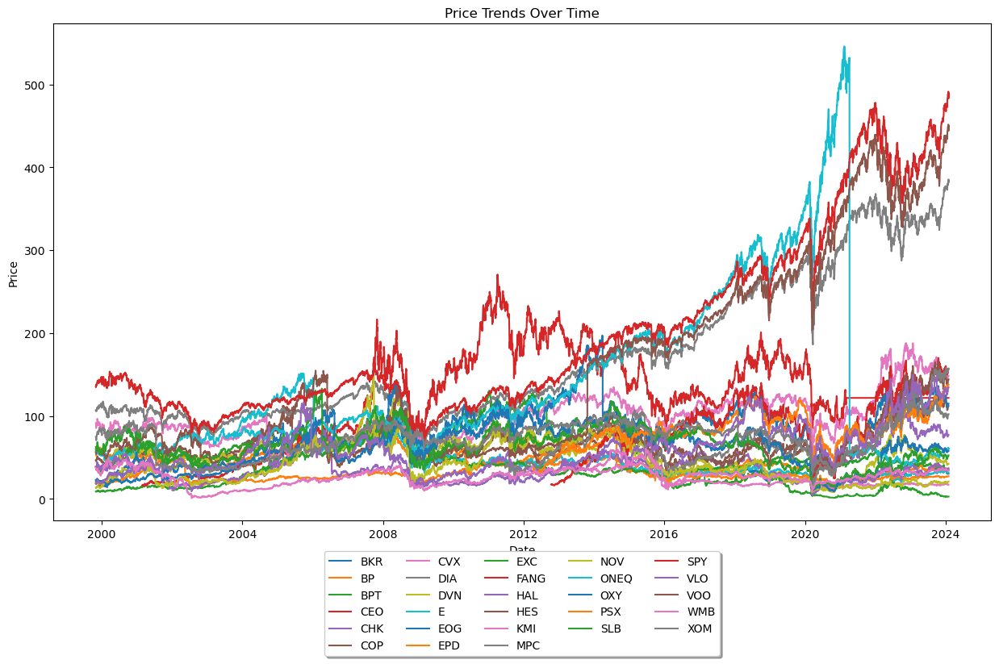

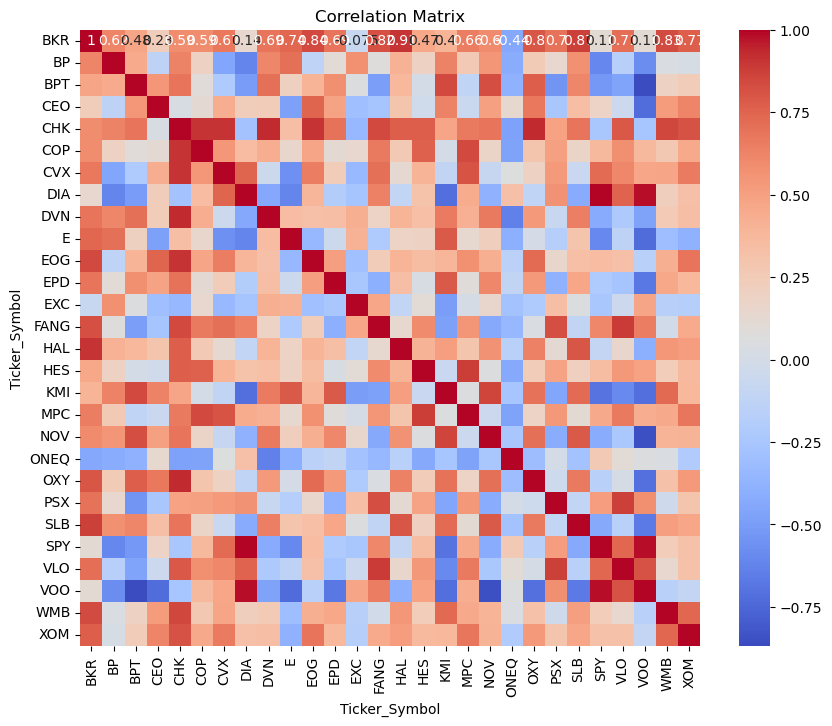

In [7]:

perform_eda(combined_df)

In [11]:
def perform_eda(dataframe):
    # Summary statistics
    #print("Summary Statistics:")
    #print(dataframe.describe())

    # Price trends visualization
    plt.figure(figsize=(15, 8))
    for column in dataframe.columns:
        plt.plot(dataframe.index, dataframe[column], label=column)
    plt.title('Price Trends Over Time')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    plt.show()

    # Correlation matrix
    corr_matrix = dataframe.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix')
    plt.show()


## Prices
1. Filter geography
   - Keep rows where name in gasoline column ends with US

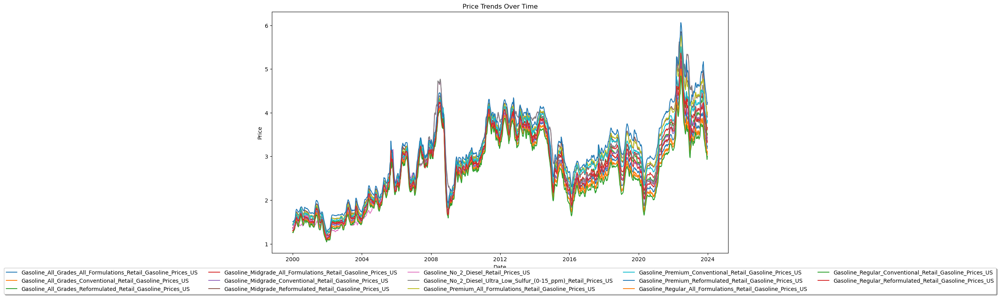

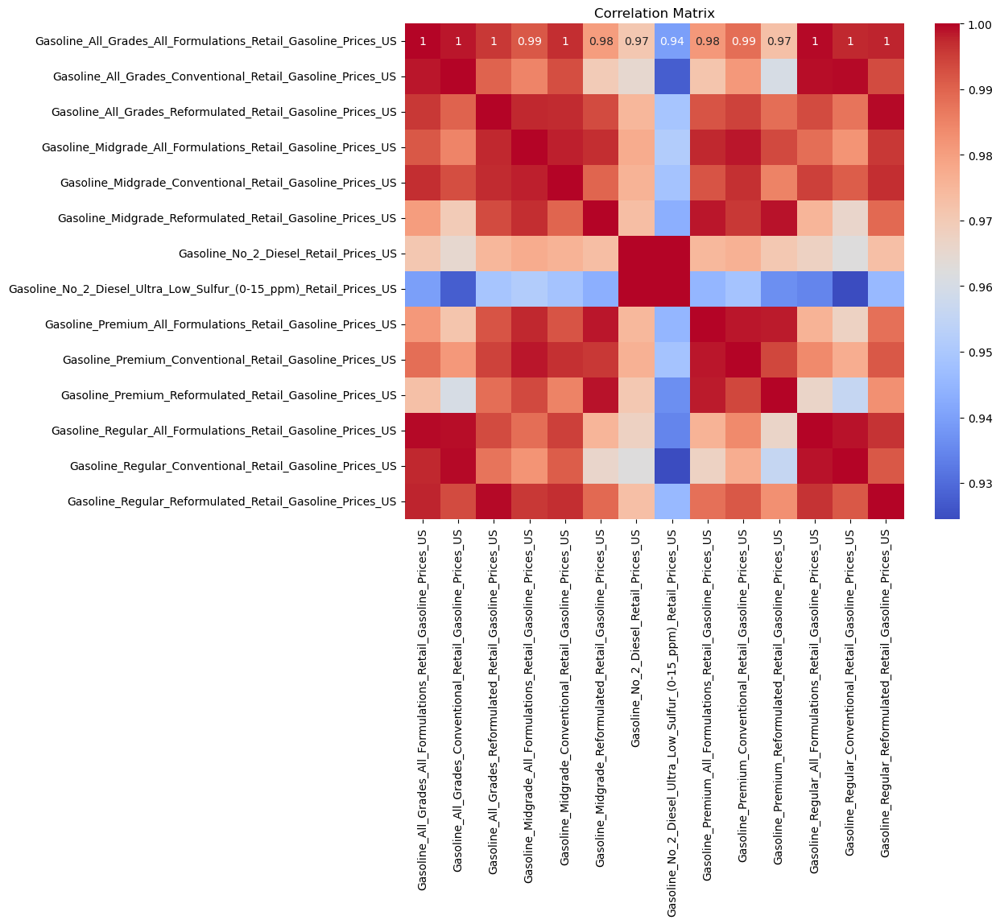

In [13]:
location = "US"
type_cols = [col for col in gasoline_df.columns if col.endswith(f'_{location}')]
#col.startswith('Gasoline_') and


gasoline_df_us = gasoline_df[type_cols]
#gasoline_df_retail =
#gasoline_df_crude =

perform_eda(gasoline_df_us)
#perform_eda(gasoline_df_retail)
#perform_eda(gasoline_df_crude)

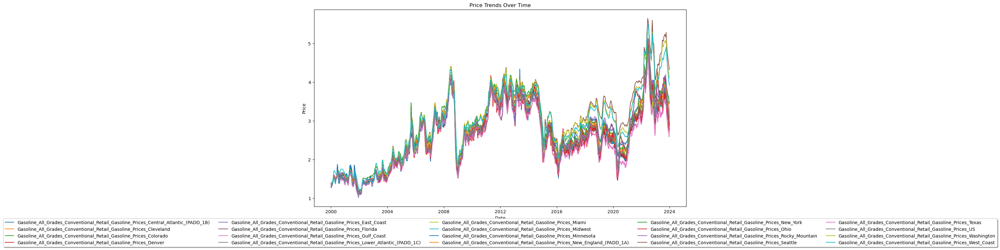

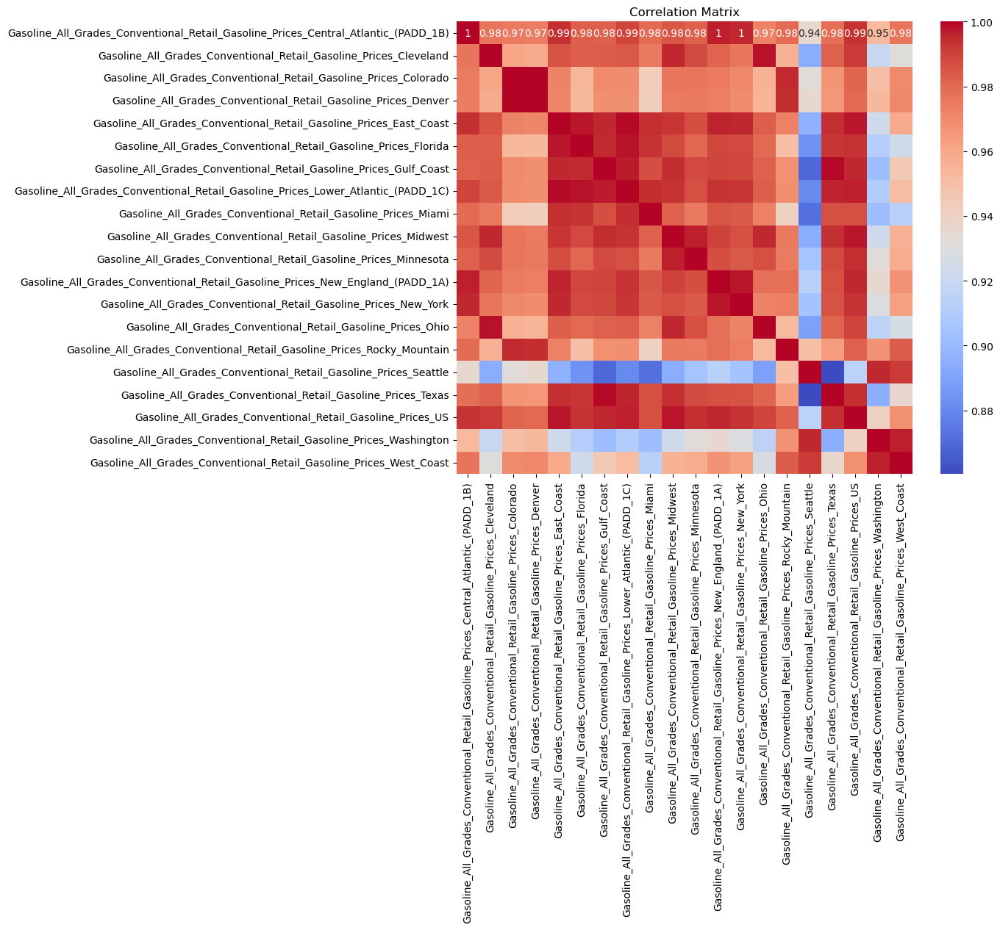

In [14]:
type_gas = "Gasoline_All_Grades_Conventional"
selected_cols = [col for col in gasoline_df.columns if col.startswith(type_gas)]
#col.startswith('Gasoline_') and

gasoline_df_retail_all = gasoline_df[selected_cols]
perform_eda(gasoline_df_retail_all)

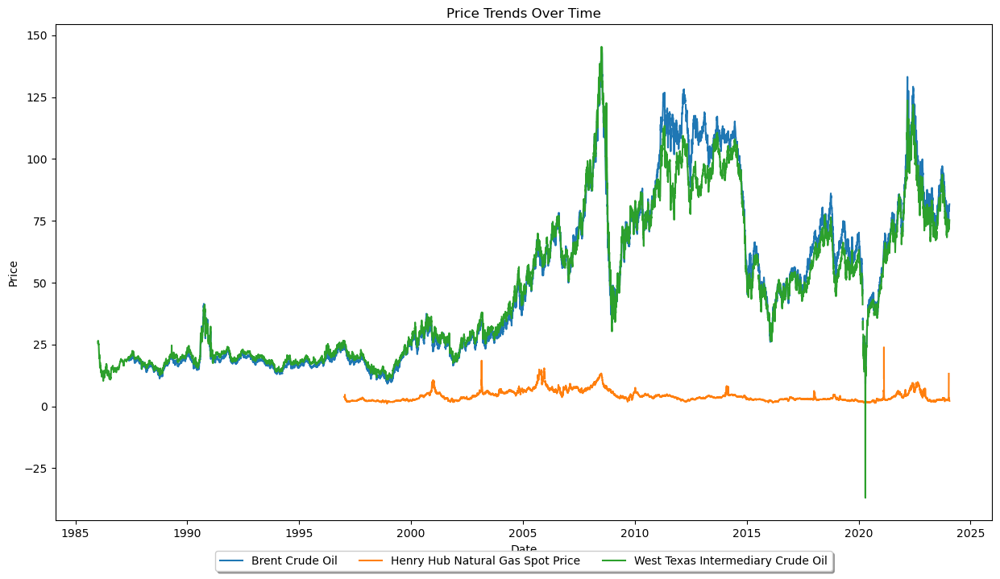

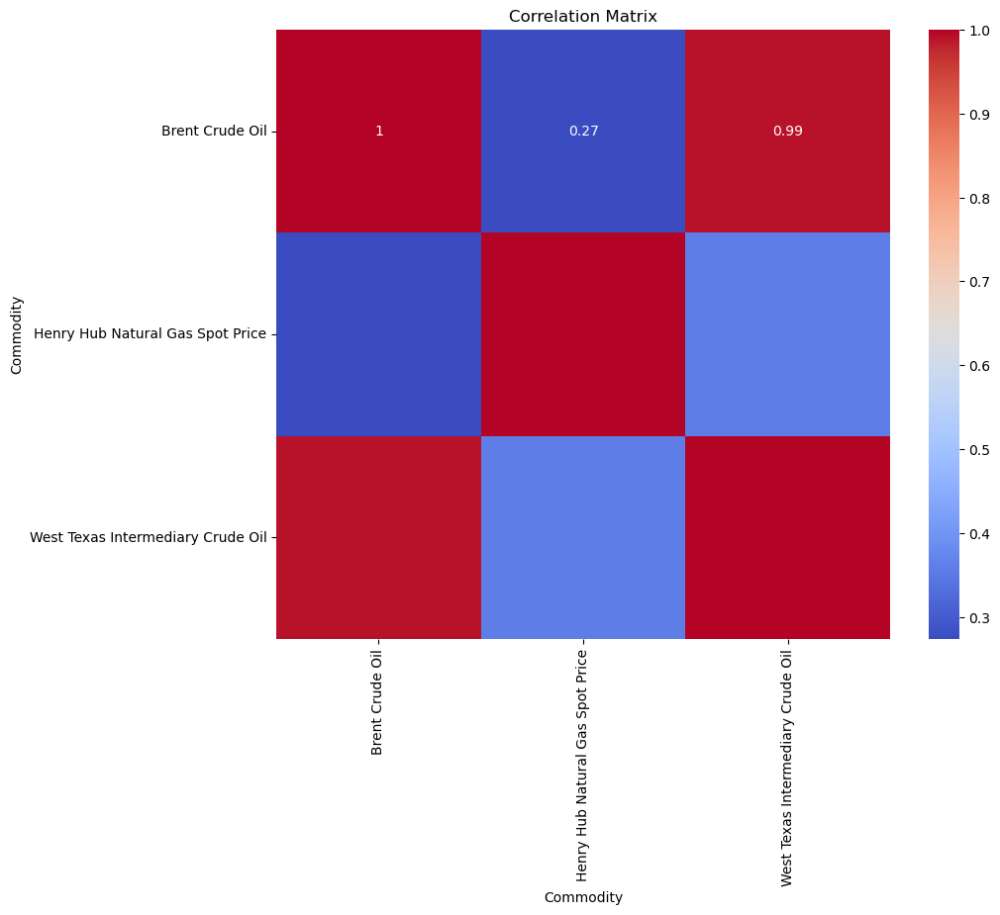

In [15]:
perform_eda(commodity_df)

**Rolling Correlation**

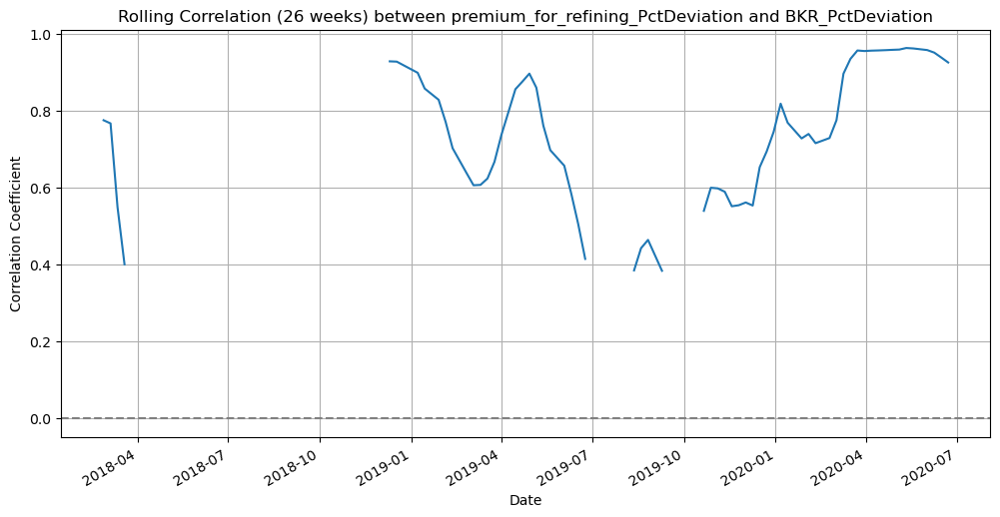

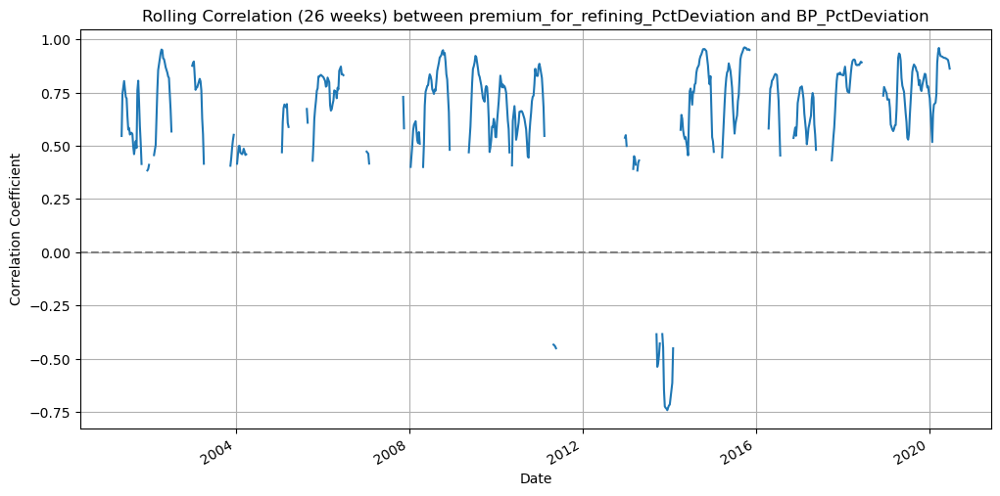

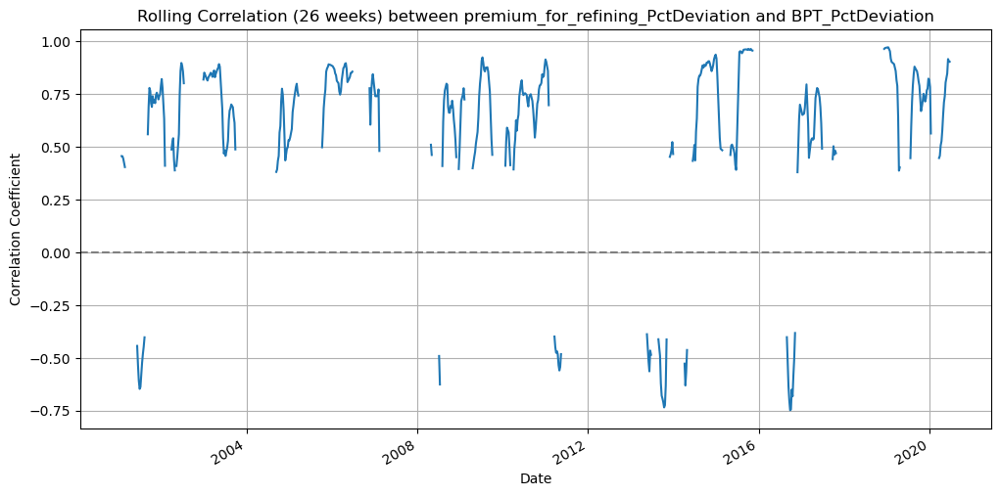

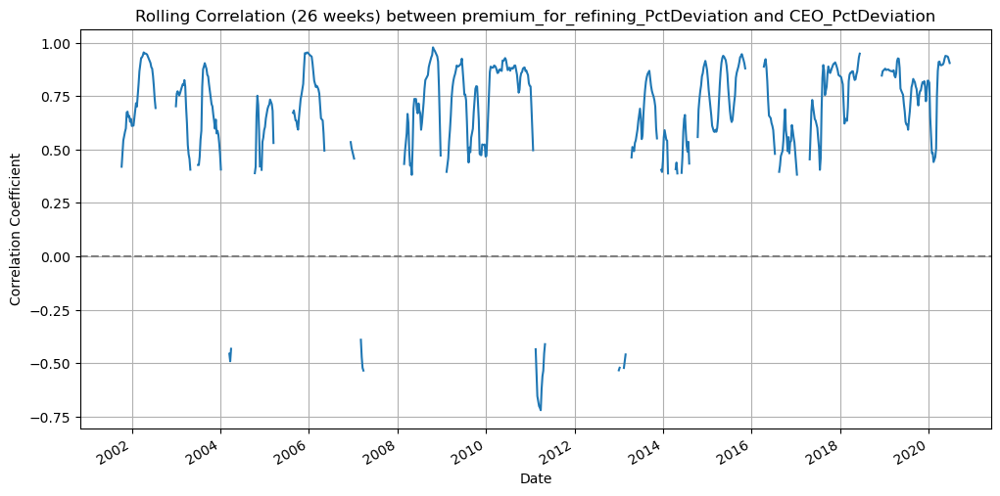

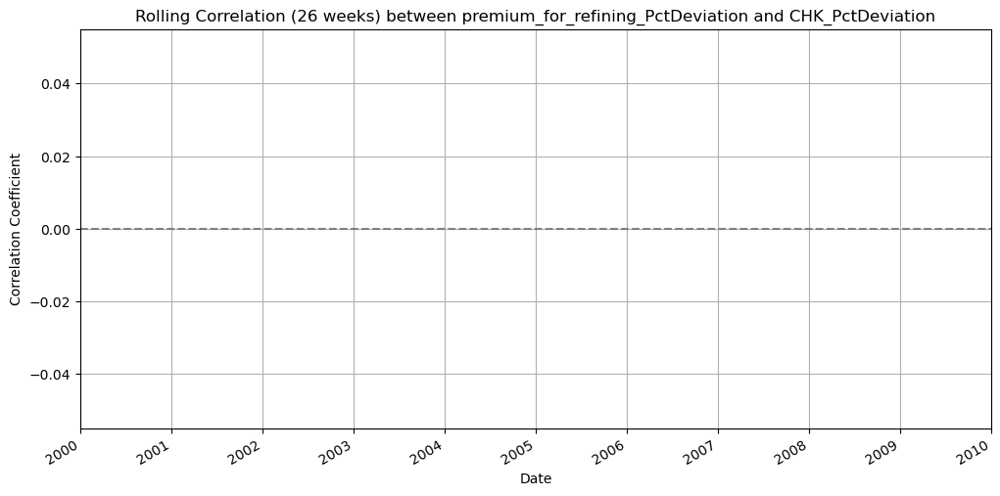

...

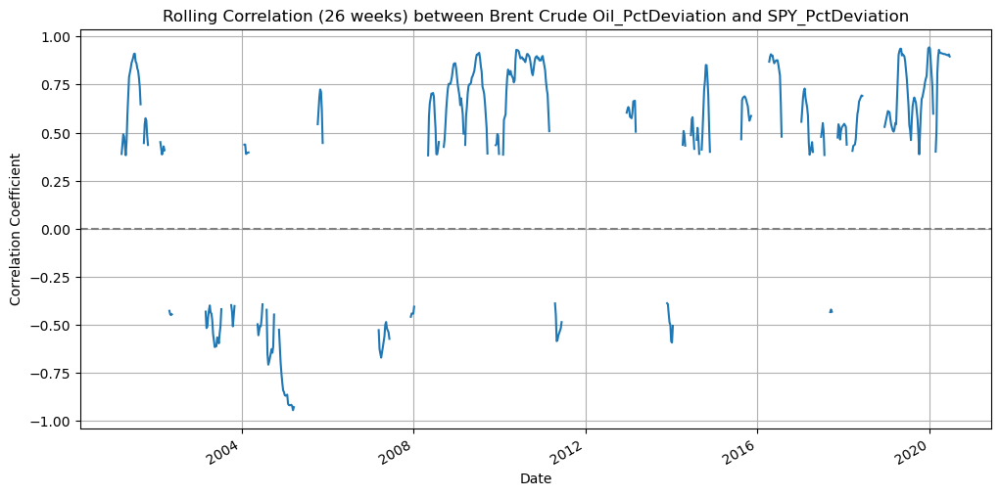

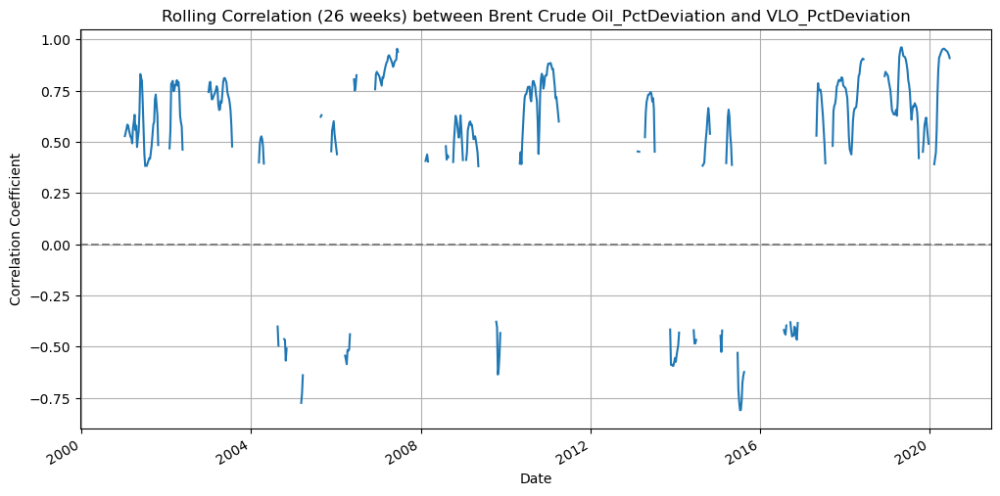

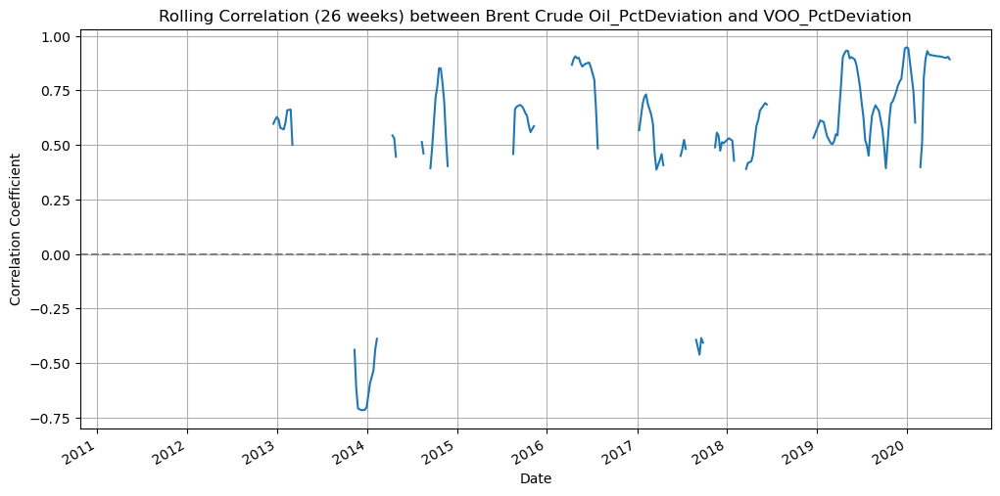

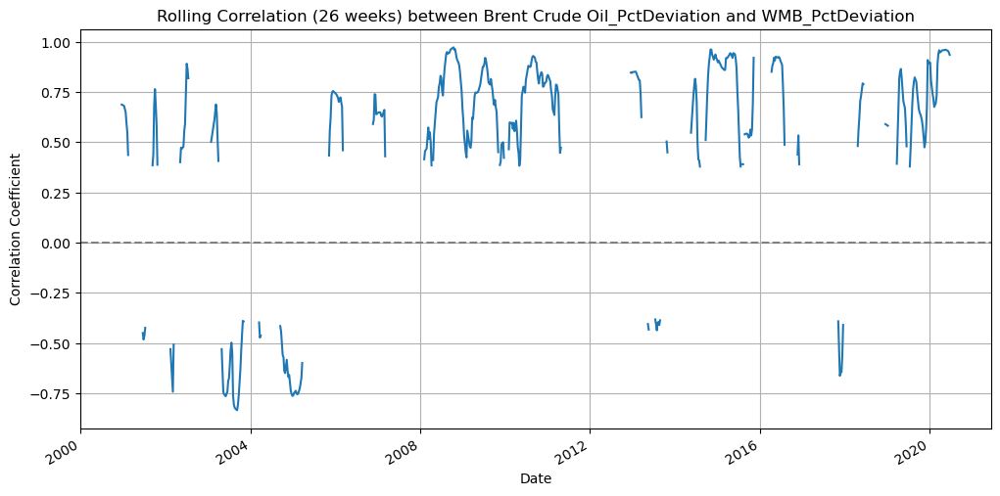

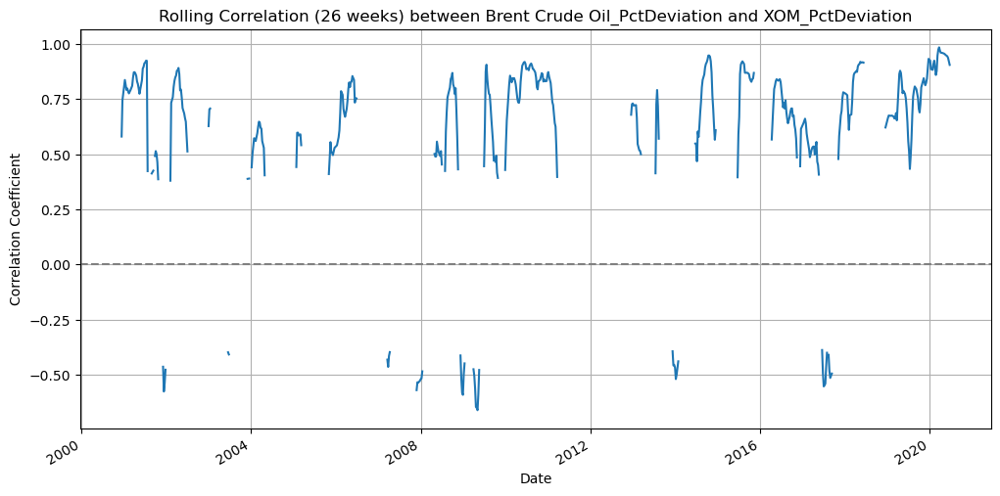

In [18]:


merged_df_draft = pd.merge(gasoline_df, combined_df, left_index=True, right_index=True, how='inner')
merged_df = pd.merge(merged_df_draft, commodity_df, left_index=True, right_index=True, how='inner')


# create a new variable that is the difference between crude and refined oil
merged_df['premium_for_refining']= merged_df['Gasoline_All_Grades_Conventional_Retail_Gasoline_Prices_US']-merged_df['Brent Crude Oil']

# Calculate p-values for significance
def calculate_p_value(r, n):
    t = r * np.sqrt((n - 2) / (1 - r**2))
    return 2 * (1 - stats.t.cdf(np.abs(t), df=n-2))

def calculate_rolling_correlation(merged_df, var1, var2, window=26, min_periods=12):
    """
    Calculate rolling correlation between two variables with significance testing

    Parameters:
    merged_df (DataFrame): Merged dataset with all variables
    var1 (str): First variable name
    var2 (str): Second variable name
    window (int): Rolling window size in weeks
    min_periods (int): Minimum observations needed for calculation

    Returns:
    Series: Rolling correlations (NaN where not significant)
    """
    # Extract the two variables
    x = merged_df[var1]
    y = merged_df[var2]

    # Calculate rolling correlation
    rolling_corr = x.rolling(window=window, min_periods=min_periods).corr(y)

    # Only keep correlations that are significant at p < 0.05
    n_obs = x.rolling(window=window, min_periods=min_periods).count()
    p_values = calculate_p_value(rolling_corr, n_obs)
    significant_corr = rolling_corr.where(p_values < 0.10)

    """Plot the rolling correlation"""
    plt.figure(figsize=(12, 6))
    significant_corr.plot(title=f'Rolling Correlation (26 weeks) between {var1} and {var2}')
    plt.axhline(0, color='gray', linestyle='--')
    plt.ylabel('Correlation Coefficient')
    plt.xlabel('Date')
    plt.grid(True)
    plt.show()

    return significant_corr

x_vars = ['premium_for_refining', 'Gasoline_All_Grades_Conventional_Retail_Gasoline_Prices_US', 'Brent Crude Oil']
y_vars = ['BKR', 'BP', 'BPT', 'CEO', 'CHK', 'COP', 'CVX', 'DIA', 'DVN', 'E',
       'EOG', 'EPD', 'EXC', 'FANG', 'HAL', 'HES', 'KMI', 'MPC', 'NOV', 'ONEQ',
       'OXY', 'PSX', 'SLB', 'SPY', 'VLO', 'VOO', 'WMB', 'XOM']

all_vars = list(set(x_vars + y_vars))

window = 20
min_periods = 10

for col in all_vars:
    if col in merged_df.columns:
        # Calculate rolling average
        rolling_avg = merged_df[col].rolling(window=window).mean()
        # Calculate percentage deviation
        merged_df[f'{col}_PctDeviation'] = (merged_df[col] - rolling_avg) / rolling_avg * 100

df_correlation = []
x_vars_pct = [f"{var}_PctDeviation" for var in x_vars]
y_vars_pct = [f"{var}_PctDeviation" for var in y_vars]


for x_i in x_vars_pct:
    for y_i in y_vars_pct:
        # Create column name for the correlation
        corr_col = f'RollingCorr_{x_i}_vs_{y_i}'

        # Calculate rolling correlation
        calculate_rolling_correlation(
            merged_df,
            x_i,
            y_i,
            window=window,
            min_periods=min_periods
        )
#calculate_rolling_correlation(merged_df, col +'_PctDeviation' , 'SPY_PctDeviation', window=20, min_periods=10)
#calculate_rolling_correlation(merged_df, col , 'SPY', window=20, min_periods=10)

#calculate_rolling_correlation(merged_df, col +'_PctDeviation' , 'VOO_PctDeviation', window=20, min_periods=10)
#calculate_rolling_correlation(merged_df, col +'_PctDeviation' , 'BKR_PctDeviation', window=20, min_periods=20)

- overall correlations
  - mostly positive for all stocks
  - some seasonal variation - really obvious for Brent crude Oil vs BKR

**Cross-Correlation between stocks and price**

/var/folders/cr/36btg3p15138sc76kdvyfcpm0000gr/T/ipykernel_64006/1758552045.py:6: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  returns_df = analysis_df.pct_change().dropna()


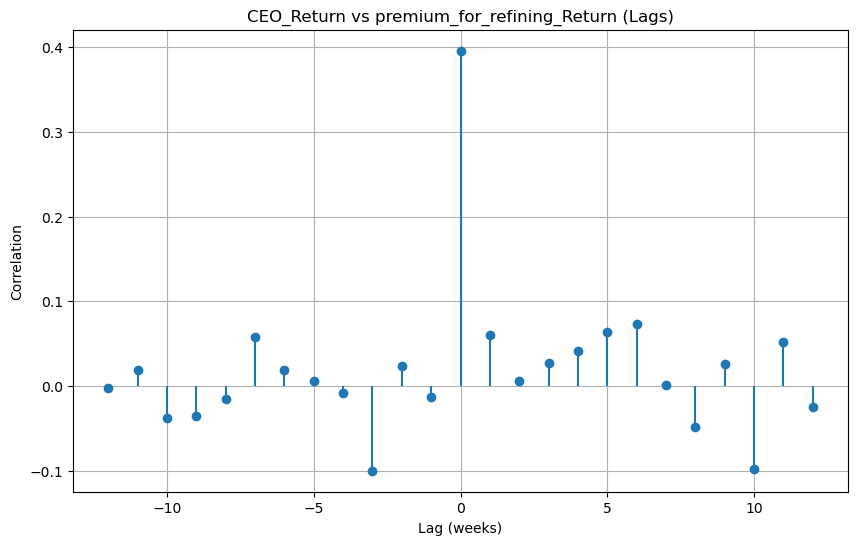

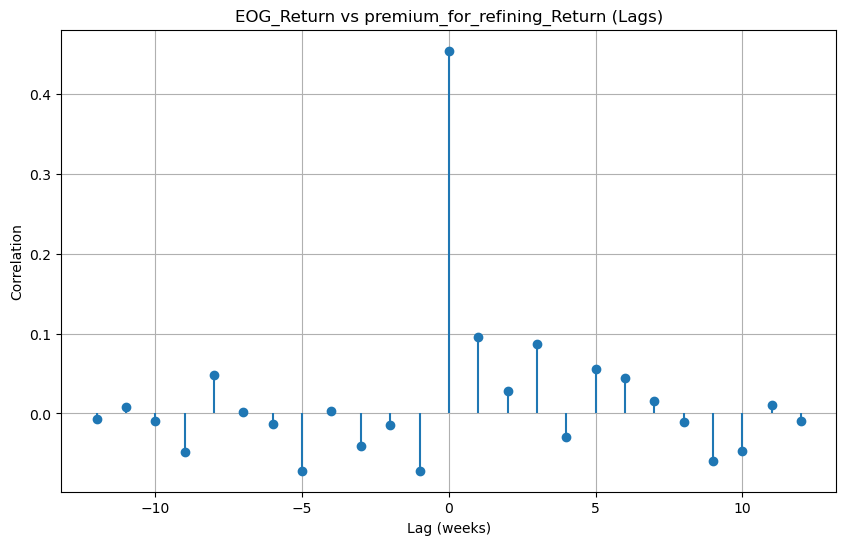

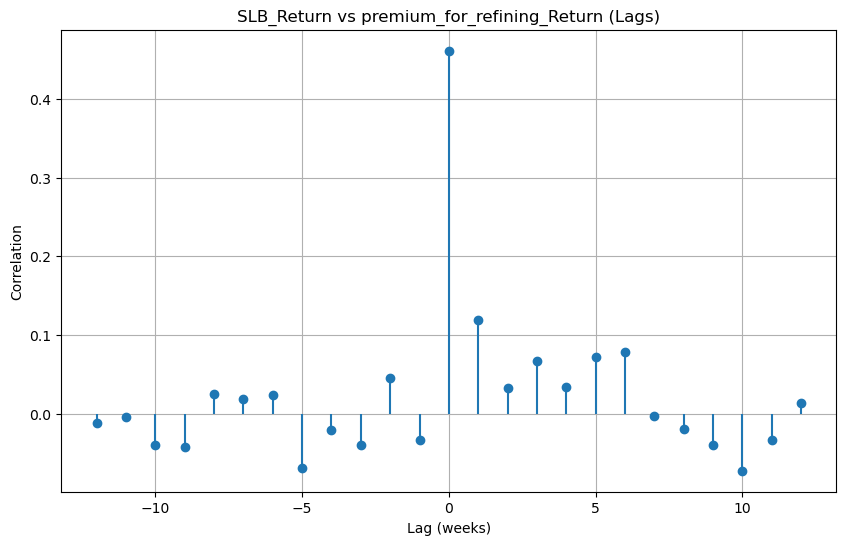

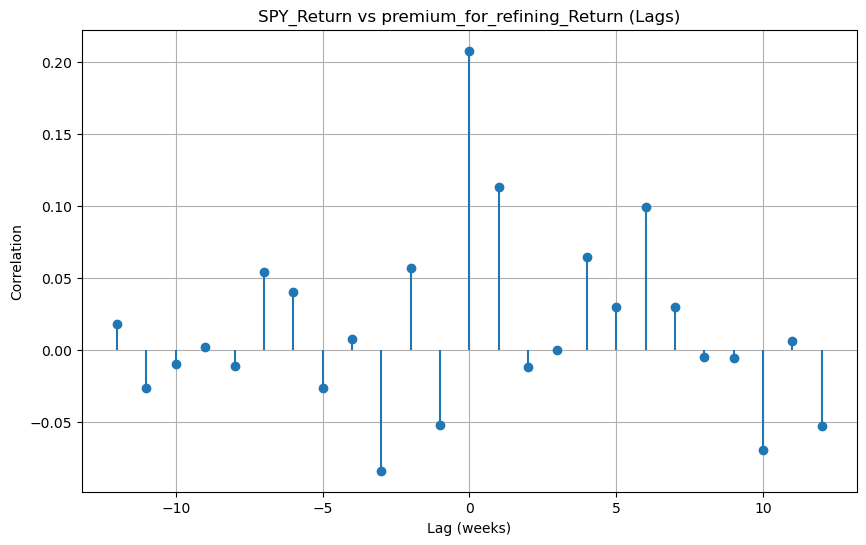

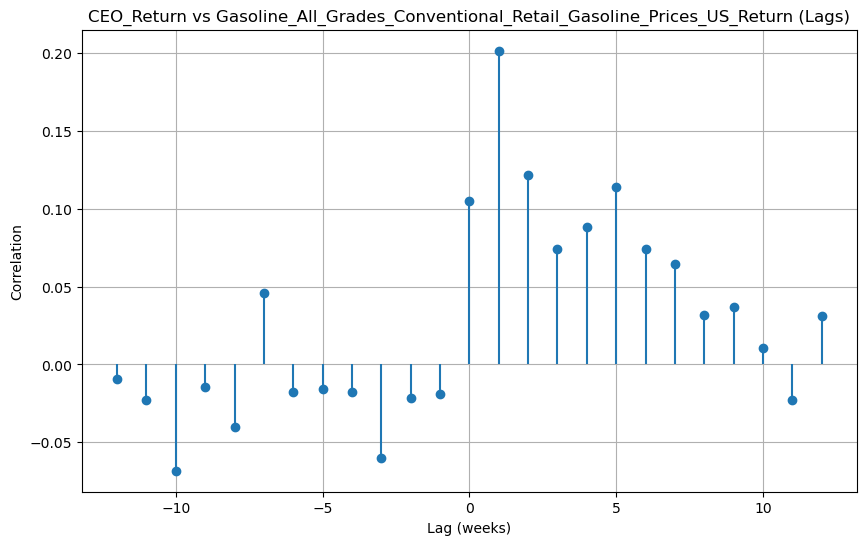

...

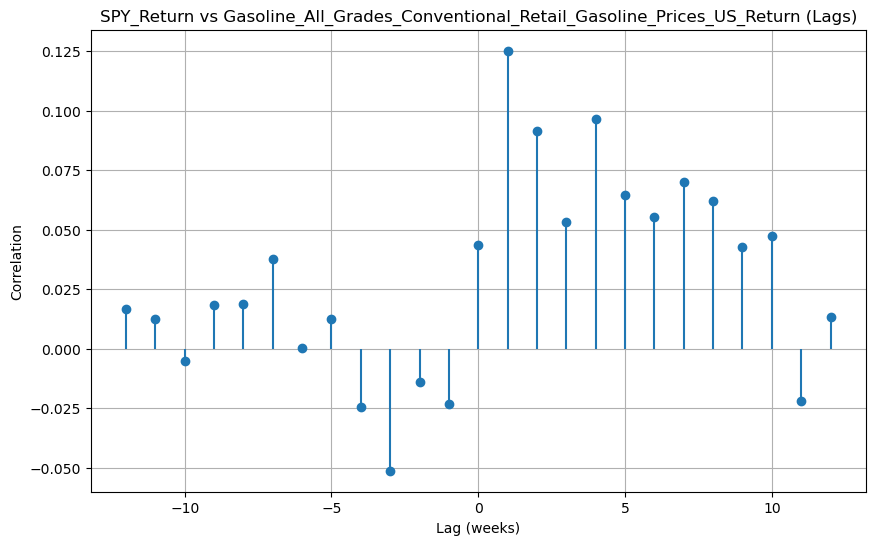

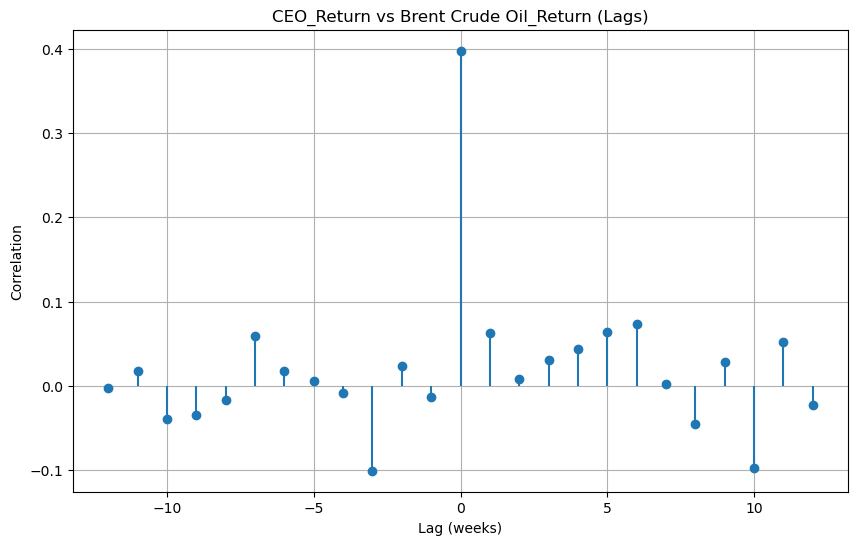

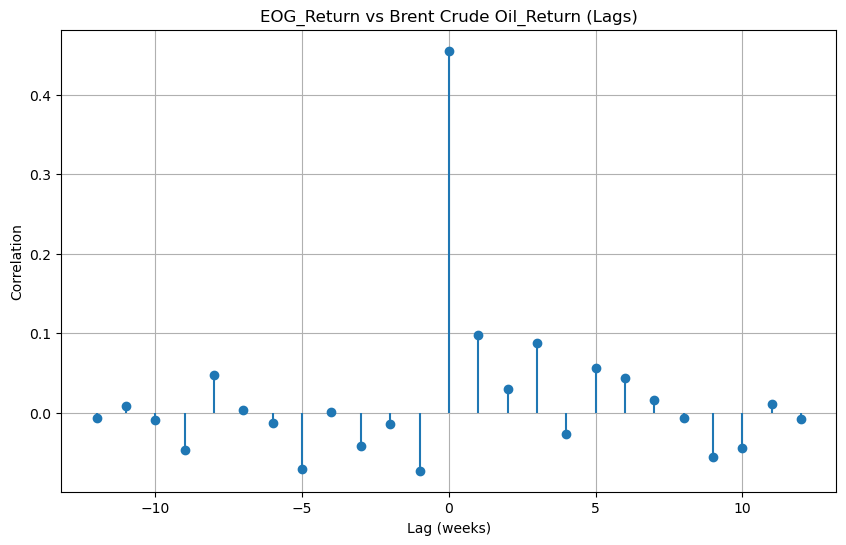

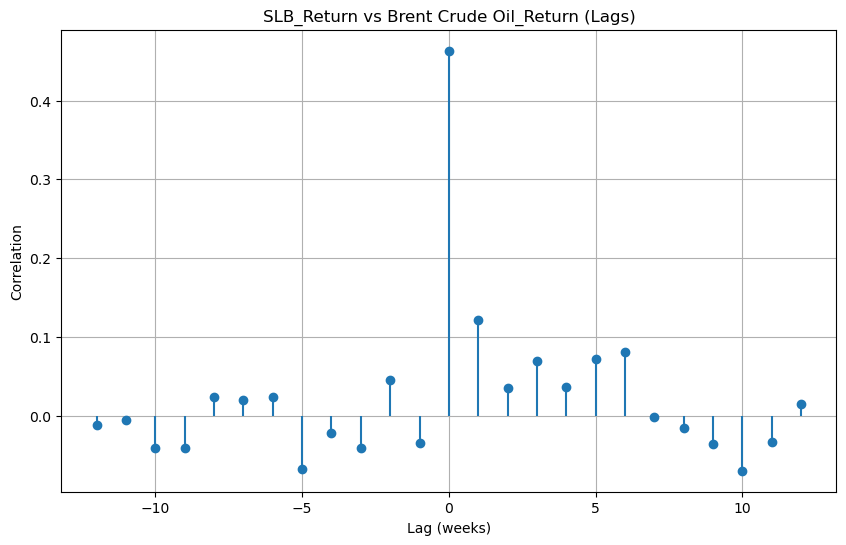

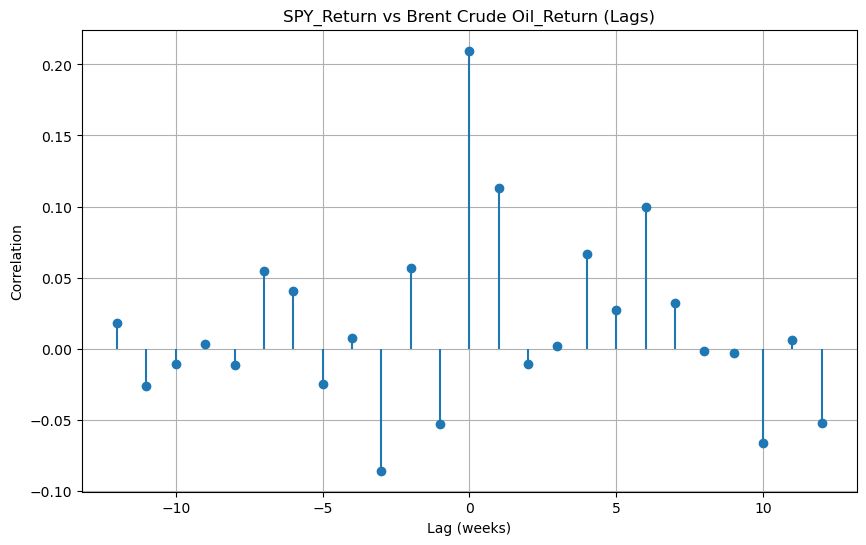

In [22]:

selected_gasoline = x_vars
selected_stocks = y_vars

analysis_df = merged_df[all_vars]

returns_df = analysis_df.pct_change().dropna()
returns_df.columns = [f'{col}_Return' for col in returns_df.columns]

def cross_correlation_analysis(series_x, series_y, max_lag=12, min_obs=5):
    """
    Calculate cross-correlations with NaN handling
    """
    results = []

    for lag in range(-max_lag, max_lag+1):
        if lag < 0:
            corr = series_x.shift(-lag).corr(series_y)
        else:
            corr = series_x.corr(series_y.shift(lag))

        results.append({
            'Lag': lag,
            'Correlation': corr,
            'Absolute_Correlation': abs(corr)
        })

    # Return UNSORTED results in lag order
    return pd.DataFrame(results)

def plot_cross_correlations(gas_series, stock_series, max_lag=12):
    """Plot cross-correlations with proper NaN handling"""
    plt.figure(figsize=(12, 6))

    # Calculate correlations
    ccf = cross_correlation_analysis(gas_series, stock_series, max_lag)

    # Fill NaN correlations with 0 for plotting
    plot_data = ccf.fillna({'Correlation': 0})

    # Create stem plot
    markerline, stemlines, baseline = plt.stem(plot_data['Lag'], plot_data['Correlation'],
                                            linefmt='C0-', markerfmt='C0o',
                                            basefmt=" ")

    # Formatting
    plt.title(f'{stock_series.name} vs {gas_series.name} (Lags)')
    plt.xlabel('Lag (weeks)')
    plt.ylabel('Correlation')
    plt.xticks(range(-max_lag, max_lag+1))
    plt.grid(True)
    plt.ylim(-1.1, 1.1)  # Fixed correlation range

    # Add warning for NaN values
    if ccf['Correlation'].isna().any():
        plt.text(0.05, 0.95,
                "Warning: Some correlations could not be calculated\n(insufficient data)",
                transform=plt.gca().transAxes,
                color='red')

    plt.show()


def plot_cross_correlations(gas_series, stock_series, max_lag=12):
    """Plot cross-correlations with different lags"""
    plt.figure(figsize=(10, 6))

    # Calculate correlations
    ccf = cross_correlation_analysis(gas_series, stock_series, max_lag)
    ccf = ccf.sort_values('Lag')  # Ensure proper lag order
    # Create basic stem plot
    markerline, stemlines, baseline = plt.stem(ccf['Lag'], ccf['Correlation'],
                                            linefmt='C0-', markerfmt='C0o',
                                            basefmt=" ")

    plt.title(f'{stock_series.name} vs {gas_series.name} (Lags)')
    plt.xlabel('Lag (weeks)')
    plt.ylabel('Correlation')
    plt.grid(True)
    plt.show()

# For each combination of gasoline and stock
for gas in selected_gasoline:
    for stock in selected_stocks:
        plot_cross_correlations(returns_df[f'{gas}_Return'], returns_df[f'{stock}_Return'], max_lag=12)


- most are correlated with lag 0 - some companies like DIA, ECX, SPY, VOO are correlated more with premium for refining with lags of 10 weeks - why?
- gasoline returns correlate with many stock returns with a lag of 0 and 1
- note that most of these correlations may not be statistically significant - since it is rolling correlation - causality tests of lags help with that

**Granger Causality Test**

In [ ]:
# Run reverse causality tests: Does stock return predict gasoline return?
for gasoline in selected_gasoline:
    gasoline_col = f'{gasoline}_Return'
    if returns_df[gasoline_col].nunique() == 1:
        print(f"\nWarning: {gasoline} has constant returns. Skipping reverse Granger tests.")
        continue

    for stock in selected_stocks:
        stock_col = f'{stock}_Return'
        if returns_df[stock_col].nunique() == 1:
            print(f"Warning: {stock} has constant returns. Skipping reverse Granger test with {gasoline}.")
            continue

        print(f"\nReverse Granger Causality: Does {stock} predict {gasoline}?")
        try:
            gc_results = run_granger_tests(returns_df, stock_col, gasoline_col)
            print(gc_results)
            if any(gc_results['p-value'] < 0.05):
                best_lag = gc_results.loc[gc_results['p-value'].idxmin(), 'Lag']
                print(f"Significant at lag {best_lag} (p < 0.05)")
            else:
                print("No significant predictive relationship found")
        except Exception as e:
            print(f"Error testing {stock} -> {gasoline}: {str(e)}")


**Analysis:**
- Short lag (~1) from firms with direct operational exposure (refiners, producers, services).
- Longer lag (~5) from ETFs, diversified portfolios
> - Like SPY, DIA, VOO
> - suggest that even non-oil-related firms are indirectly affected by changes in oil prices, potentially through investor sentiment or broader economic effects
- Refining premium is a stronger indicator than gasoline price for refiners.
> - Seen for VLO, MPC and PSX
- Retail Gasoline price is a good general indicator for most firms
> - As it affects consumer disposable income, transport costs
  


In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

def run_granger_tests(data, x_col, y_col, max_lag=5):
    """Perform Granger causality tests"""
    test_data = data[[x_col, y_col]].dropna()
    results = grangercausalitytests(test_data, maxlag=max_lag, verbose=False)

    # Extract p-values
    p_values = [round(results[i+1][0]['ssr_chi2test'][1], 4)
               for i in range(max_lag)]
    return pd.DataFrame({'Lag': range(1, max_lag+1), 'p-value': p_values})

selected_gasoline = x_vars
selected_stocks = y_vars


# Run causality tests for each gasoline and stock combination
for gasoline in selected_gasoline:
    gasoline_col = f'{gasoline}_Return'
    if returns_df[gasoline_col].nunique() == 1:  # Check if gasoline returns are constant
        print(f"\nWarning: {gasoline} has constant returns. Skipping Granger tests for this gasoline type.")
        continue

    for stock in selected_stocks:
        stock_col = f'{stock}_Return'
        if returns_df[stock_col].nunique() == 1:  # Check if stock returns are constant
            print(f"Warning: {stock} has constant returns. Skipping Granger test with {gasoline}.")
            continue

        print(f"\nGranger Causality: Does {gasoline} predict {stock}?")
        try:
            gc_results = run_granger_tests(returns_df, gasoline_col, stock_col)
            print(gc_results)
            if any(gc_results['p-value'] < 0.05):
                best_lag = gc_results.loc[gc_results['p-value'].idxmin(), 'Lag']
                print(f"Significant at lag {best_lag} (p < 0.05)")
            else:
                print("No significant predictive relationship found")
        except Exception as e:
            print(f"Error testing {gasoline} -> {stock}: {str(e)}")


# Bibliography 
